In [11]:
import pandas as pd
import numpy as np

from collections import Counter
import collections
import codecs
import nltk
#nltk.download('averaged_perceptron_tagger')

import matplotlib.pyplot as plt

In [12]:
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords

english_stopwords = set(stopwords.words('english'))

with codecs.open("obama_clean.txt", "r", "utf-8-sig") as text_file:
    r = text_file.read()
    tokenizer = RegexpTokenizer(r'\w+')
    _tokens = tokenizer.tokenize(r)
    tokens = [t for t in _tokens if t.lower() not in english_stopwords]

In [118]:
len(r)

53806238

In [111]:
density_text = r[:9765973]

tokenizer = RegexpTokenizer(r'\w+')
_density_tokens = tokenizer.tokenize(density_text)
density_tokens = [t for t in _density_tokens if t.lower() not in english_stopwords]

[3.9894312961563063]


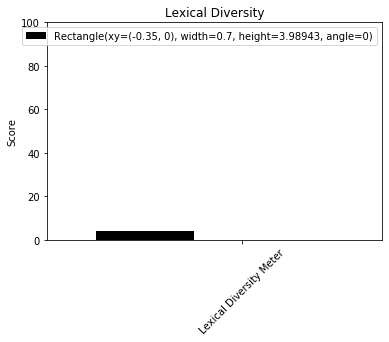

In [112]:
st = len(set(density_tokens))
lt = len(density_tokens)
y = [st*100/lt]
print(y)

fig = plt.figure()
ax = fig.add_subplot(111)
N = 1
ind = np.arange(N)
width = 0.7
rect = ax.bar(ind, y, width, color="black")
ax.set_xlim(-width,len(ind)+width)
ax.set_ylim(0,100)
ax.set_ylabel("Score")
ax.set_title("Lexical Diversity")
xTickMarks = ["Lexical Diversity Meter"]
ax.set_xticks(ind+width)
xtickNames = ax.set_xticklabels(xTickMarks)
plt.setp(xtickNames, rotation=45, fontsize=10)
ax.legend( (rect[0], ("") ))
plt.show()

[1.4442409612475429]


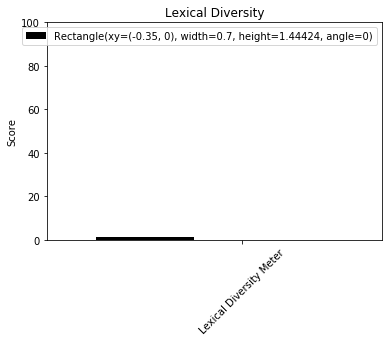

In [32]:
st = len(set(tokens))
lt = len(tokens)
y = [st*100/lt]
print(y)

fig = plt.figure()
ax = fig.add_subplot(111)
N = 1
ind = np.arange(N)
width = 0.7
rect = ax.bar(ind, y, width, color="black")
ax.set_xlim(-width,len(ind)+width)
ax.set_ylim(0,100)
ax.set_ylabel("Score")
ax.set_title("Lexical Diversity")
xTickMarks = ["Lexical Diversity Meter"]
ax.set_xticks(ind+width)
xtickNames = ax.set_xticklabels(xTickMarks)
plt.setp(xtickNames, rotation=45, fontsize=10)
ax.legend( (rect[0], ("") ))
plt.show()

In [33]:
tagged = nltk.pos_tag(tokens)
counts = Counter(tag for word,tag in tagged)
keys = counts.keys()
y_pos = np.arange(len(keys))
p = [counts[k] for k in keys]
error = np.random.rand(len(keys))

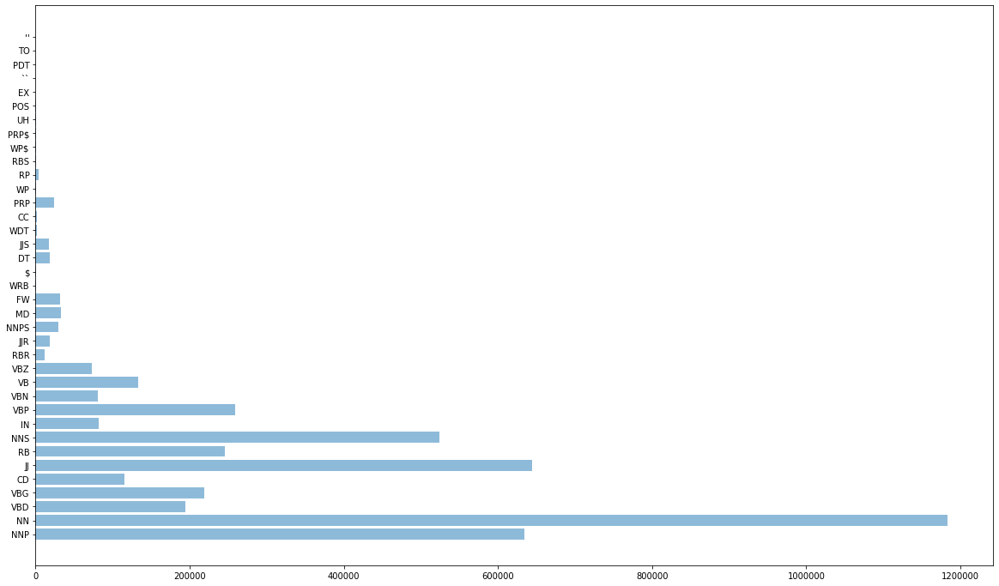

In [34]:
plt.figure(figsize=(20, 12))

y_pos = np.arange(len(keys))

plt.barh(y_pos, p, align='center', alpha=0.5)
plt.yticks(y_pos, keys)

plt.show()

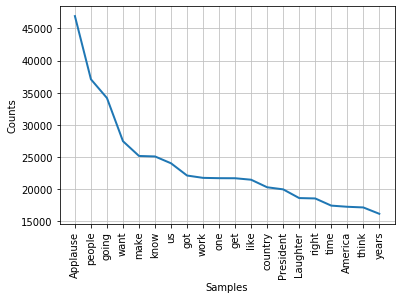

In [35]:
dist = nltk.FreqDist(tokens)
dist.plot(20, cumulative=False);

In [36]:
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()

In [37]:
lem_tokens = []
for token in tokens:
    lem_tokens.append(lemmatizer.lemmatize(token))

In [38]:
lem_text = nltk.Text(lem_tokens)
print("\n".join(lem_text.collocation_list(num=20)))

United States
make sure
MRS OBAMA
middle class
health care
White House
young people
God bless
Prime Minister
small business
men woman
want thank
around world
little bit
Thank much
year ago
across country
tax cut
every single
making sure


In [39]:
text = nltk.Text(_tokens)
print("\n".join(text.collocation_list(num=20)))

United States
make sure
MRS OBAMA
middle class
health care
White House
young people
God bless
Prime Minister
little bit
years ago
American people
making sure
every single
President Obama
clean energy
21st century
First Lady
AUDIENCE MEMBER
every day


In [40]:
from nltk.util import ngrams

In [41]:
output = list(ngrams(tokens, 3))
output

[('WASHINGTON', 'DC', 'week'),
 ('DC', 'week', 'address'),
 ('week', 'address', 'President'),
 ('address', 'President', 'Obama'),
 ('President', 'Obama', 'discussed'),
 ('Obama', 'discussed', 'upcoming'),
 ('discussed', 'upcoming', 'farewell'),
 ('upcoming', 'farewell', 'address'),
 ('farewell', 'address', 'nation'),
 ('address', 'nation', '1796'),
 ('nation', '1796', 'George'),
 ('1796', 'George', 'Washington'),
 ('George', 'Washington', 'set'),
 ('Washington', 'set', 'precedent'),
 ('set', 'precedent', 'peaceful'),
 ('precedent', 'peaceful', 'democratic'),
 ('peaceful', 'democratic', 'transfer'),
 ('democratic', 'transfer', 'power'),
 ('transfer', 'power', 'also'),
 ('power', 'also', 'set'),
 ('also', 'set', 'precedent'),
 ('set', 'precedent', 'penning'),
 ('precedent', 'penning', 'farewell'),
 ('penning', 'farewell', 'address'),
 ('farewell', 'address', 'American'),
 ('address', 'American', 'people'),
 ('American', 'people', '220'),
 ('people', '220', 'years'),
 ('220', 'years', 'si

In [42]:
import operator

def count_grams(value_list):
    values = {}
    for gram in value_list:
        if gram not in values.keys():
            values[gram] = 1
        else:
            values[gram] += 1
    values_sorted = collections.OrderedDict(sorted(values.items(), key=operator.itemgetter(1), reverse=True))
    return values_sorted

count_grams(output)

OrderedDict([(('United', 'States', 'America'), 2454),
             (('every', 'single', 'day'), 1127),
             (('President', 'United', 'States'), 1121),
             (('want', 'make', 'sure'), 1089),
             (('middle', 'class', 'families'), 1010),
             (('States', 'America', 'Applause'), 784),
             (('round', 'applause', 'Applause'), 784),
             (('big', 'round', 'applause'), 761),
             (('Affordable', 'Care', 'Act'), 692),
             (('got', 'make', 'sure'), 664),
             (('men', 'women', 'uniform'), 648),
             (('God', 'bless', 'God'), 646),
             (('bless', 'God', 'bless'), 646),
             (('Yes', 'MRS', 'OBAMA'), 622),
             (('bless', 'United', 'States'), 591),
             (('Thank', 'much', 'everybody'), 579),
             (('people', 'back', 'work'), 573),
             (('God', 'bless', 'United'), 566),
             (('million', 'new', 'jobs'), 554),
             (('Thank', 'Mr', 'President'), 499),
 

In [43]:
import spacy
from spacy import displacy
from collections import Counter
import en_core_web_sm
nlp = en_core_web_sm.load()

/home/luci/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
/home/luci/anaconda3/lib/python3.7/site-packages/thinc/neural/_custom_kernels.py:36: ResourceWarning: unclosed file <_io.TextIOWrapper name='/home/luci/anaconda3/lib/python3.7/site-packages/thinc/neural/_custom_kernels.cu' mode='r' encoding='utf8'>
  SRC = (PWD / "_custom_kernels.cu").open("r", encoding="utf8").read()
/home/luci/anaconda3/lib/python3.7/site-packages/thinc/neural/_custom_kernels.py:39: ResourceWarning: unclosed file <_io.TextIOWrapper name='/home/luci/anaconda3/lib/python3.7/site-packages/thinc/neural/_murmur3.cu' mode='r' encoding='utf8'>
  MMH_SRC = (PWD / "_murmur3.cu").open("r", encoding="utf8").read()


In [44]:
locations = []
organizations = []
persons = []
dates = []
times = []
percents = []
facilities = []
gpes = []
ordinals = []
cardinals = []
norps = []
moneys = []
laws = []
products = []
quantities = []

In [45]:
nlp.max_length = 19000000

In [46]:
splitted_text = r.split(" ")

In [47]:
len(r)/40

1345155.95

In [48]:
len(splitted_text)/40

232257.2

In [49]:
part1, part2, part3, part4, part5, part6, part7, part8, part9, part10, part11, part12, part13, part14, part15, part16, part17, part18, part19, part20, part21, part22, part23, part24, part25, part26, part27, part28, part29, part30, part31, part32, part33, part34, part35, part36, part37, part38, part39, part40 = [splitted_text[i:i + 232258] for i in range(0, len(splitted_text), 232258)]

In [50]:
part1 = " ".join(part1)
part2 = " ".join(part2)
part3 = " ".join(part3)
part4 = " ".join(part4)
part5 = " ".join(part5)
part6 = " ".join(part6)
part7 = " ".join(part7)
part8 = " ".join(part8)
part9 = " ".join(part9)
part10 = " ".join(part10)

part11 = " ".join(part11)
part12 = " ".join(part12)
part13 = " ".join(part13)
part14 = " ".join(part14)
part15 = " ".join(part15)
part16 = " ".join(part16)
part17 = " ".join(part17)
part18 = " ".join(part18)
part19 = " ".join(part19)
part20 = " ".join(part20)

part21 = " ".join(part21)
part22 = " ".join(part22)
part23 = " ".join(part23)
part24 = " ".join(part24)
part25 = " ".join(part25)
part26 = " ".join(part26)
part27 = " ".join(part27)
part28 = " ".join(part28)
part29 = " ".join(part29)
part30 = " ".join(part30)

part31 = " ".join(part31)
part32 = " ".join(part32)
part33 = " ".join(part33)
part34 = " ".join(part34)
part35 = " ".join(part35)
part36 = " ".join(part36)
part37 = " ".join(part37)
part38 = " ".join(part38)
part39 = " ".join(part39)
part40 = " ".join(part40)

In [51]:
#chunks = [(X.text, X.label_) for X in nlp(r).ents]
chunk1 = [(X.text, X.label_) for X in nlp(part1).ents]

In [52]:
chunk2 = [(X.text, X.label_) for X in nlp(part2).ents]

In [53]:
chunk3 = [(X.text, X.label_) for X in nlp(part3).ents]

In [54]:
chunk4 = [(X.text, X.label_) for X in nlp(part4).ents]

In [55]:
chunk5 = [(X.text, X.label_) for X in nlp(part5).ents]

In [56]:
chunk6 = [(X.text, X.label_) for X in nlp(part6).ents]

In [57]:
chunk7 = [(X.text, X.label_) for X in nlp(part7).ents]

In [58]:
chunk8 = [(X.text, X.label_) for X in nlp(part8).ents]

In [59]:
chunk9 = [(X.text, X.label_) for X in nlp(part9).ents]

In [60]:
chunk10 = [(X.text, X.label_) for X in nlp(part10).ents]

In [61]:
chunk11 = [(X.text, X.label_) for X in nlp(part11).ents]

In [62]:
chunk12 = [(X.text, X.label_) for X in nlp(part12).ents]

In [63]:
chunk13 = [(X.text, X.label_) for X in nlp(part13).ents]

In [64]:
chunk14 = [(X.text, X.label_) for X in nlp(part14).ents]

In [65]:
chunk15 = [(X.text, X.label_) for X in nlp(part15).ents]

In [66]:
chunk16 = [(X.text, X.label_) for X in nlp(part16).ents]

In [67]:
chunk17 = [(X.text, X.label_) for X in nlp(part17).ents]

In [68]:
chunk18 = [(X.text, X.label_) for X in nlp(part18).ents]

In [69]:
chunk19 = [(X.text, X.label_) for X in nlp(part19).ents]

In [70]:
chunk20 = [(X.text, X.label_) for X in nlp(part20).ents]

In [71]:
chunk21 = [(X.text, X.label_) for X in nlp(part21).ents]

In [72]:
chunk22 = [(X.text, X.label_) for X in nlp(part22).ents]

In [73]:
chunk23 = [(X.text, X.label_) for X in nlp(part23).ents]

In [74]:
chunk24 = [(X.text, X.label_) for X in nlp(part24).ents]

In [75]:
chunk25 = [(X.text, X.label_) for X in nlp(part25).ents]

In [76]:
chunk26 = [(X.text, X.label_) for X in nlp(part26).ents]

In [77]:
chunk27 = [(X.text, X.label_) for X in nlp(part27).ents]

In [78]:
chunk28 = [(X.text, X.label_) for X in nlp(part28).ents]

In [79]:
chunk29 = [(X.text, X.label_) for X in nlp(part29).ents]

In [80]:
chunk30 = [(X.text, X.label_) for X in nlp(part30).ents]

In [81]:
chunk31 = [(X.text, X.label_) for X in nlp(part31).ents]

In [82]:
chunk32 = [(X.text, X.label_) for X in nlp(part32).ents]

In [83]:
chunk33 = [(X.text, X.label_) for X in nlp(part33).ents]

In [84]:
chunk34 = [(X.text, X.label_) for X in nlp(part34).ents]

In [85]:
chunk35 = [(X.text, X.label_) for X in nlp(part35).ents]

In [86]:
chunk36 = [(X.text, X.label_) for X in nlp(part36).ents]

In [87]:
chunk37 = [(X.text, X.label_) for X in nlp(part37).ents]

In [88]:
chunk38 = [(X.text, X.label_) for X in nlp(part38).ents]

In [89]:
chunk39 = [(X.text, X.label_) for X in nlp(part39).ents]

In [90]:
chunk40 = [(X.text, X.label_) for X in nlp(part40).ents]

In [100]:
list_of_chunks = [chunk1, chunk2, chunk3, chunk4, chunk5, chunk6, chunk7, chunk8, chunk9, chunk10, chunk11, chunk12, chunk13, chunk14, chunk15, chunk16, chunk17, chunk18, chunk19, chunk20, chunk21, chunk22, chunk23, chunk24, chunk25, chunk26, chunk27, chunk28, chunk29, chunk30, chunk31, chunk32, chunk33, chunk34, chunk35, chunk36, chunk37, chunk38, chunk39, chunk40]

for chunks in list_of_chunks:
    for chunk in chunks:
        print(chunk)
        if chunk[1] == "PERSON": 
            persons.append(chunk[0])
        if chunk[1] == "LOC": 
            locations.append(chunk[0])
        if chunk[1] == "ORG": 
            organizations.append(chunk[0])
        if chunk[1] == "DATE": 
            dates.append(chunk[0])
        if chunk[1] == "TIME": 
            times.append(chunk[0])
        if chunk[1] == "PERCENT": 
            percents.append(chunk[0])
        if chunk[1] == "FAC": 
            facilities.append(chunk[0])
        if chunk[1] == "GPE": 
            gpes.append(chunk[0])
        if chunk[1] == "MONEY":
            moneys.append(chunk[0])
        if chunk[1] == "LAW":
            laws.append(chunk[0])
        if chunk[1] == "CARDINAL":
            cardinals.append(chunk[0])
        if chunk[1] == "NORP":
            norps.append(chunk[0])
        if chunk[1] == "ORDINAL":
            ordinals.append(chunk[0])
        if chunk[1] == "PRODUCT":
            products.append(chunk[0])
        if chunk[1] == "QUANTITY":
            quantities.append(chunk[0])

('WASHINGTON, DC', 'GPE')
('this week', 'DATE')
('Obama', 'PERSON')
('1796', 'DATE')
('George Washington', 'PERSON')
('American', 'NORP')
('the 220 years', 'DATE')
('American', 'NORP')
('Next week', 'DATE')
('Chicago', 'GPE')
('first', 'ORDINAL')
('American', 'NORP')
('these past eight years', 'DATE')
('9:00 PM EST', 'TIME')
('Tuesday, January 10', 'DATE')
('McCormick Place', 'PERSON')
('Chicago', 'GPE')
('Illinois', 'GPE')
('Tuesday', 'DATE')
('Remarks', 'PERSON')
('Barack Obama', 'PERSON')
('Delivered\t', 'ORG')
('January 7, 2017', 'DATE')
('the days', 'DATE')
('George Washington', 'PERSON')
('American', 'NORP')
('Tuesday', 'DATE')
('night', 'TIME')
('Chicago', 'GPE')
('Chicago', 'GPE')
('American', 'NORP')
('Washington', 'GPE')
('our minute', 'TIME')
('America', 'GPE')
('the past eight years', 'DATE')
('the past few years', 'DATE')
('the past four decades', 'DATE')
('a century', 'DATE')
('20 million', 'CARDINAL')
('Americans', 'NORP')
('the days', 'DATE')
('up to half', 'CARDINAL')


('the Gates Foundation', 'ORG')
('millions', 'CARDINAL')
('half', 'CARDINAL')
('two', 'CARDINAL')
('Many years ago', 'DATE')
("Melinda's", 'ORG')
('one', 'CARDINAL')
('two', 'CARDINAL')
('Frank Gehry', 'PERSON')
('Jewish', 'NORP')
('Frank', 'PERSON')
('Los Angeles', 'GPE')
('Guggenheim', 'FAC')
('Bilbao', 'PERSON')
('Chicago', 'GPE')
('Millennium Park', 'FAC')
('Santa Monica', 'GPE')
('Frank', 'PERSON')
('Appalachia', 'PRODUCT')
('the National Mall', 'FAC')
('many years ago', 'DATE')
('Maya Lin', 'PERSON')
('American', 'NORP')
('Maya', 'PERSON')
('Three minutes', 'TIME')
('Armstrong', 'PERSON')
('Aldrin', 'PERSON')
('Apollo', 'ORG')
('Margaret Hamilton', 'PERSON')
('MIT', 'ORG')
('the ‘60s', 'DATE')
('Margaret', 'PERSON')
('Eagle', 'ORG')
('Margaret', 'PERSON')
('Margaret', 'PERSON')
('today', 'DATE')
('American', 'NORP')
('Wright', 'PERSON')
('Edison', 'PERSON')
('Hopper', 'ORG')
('1906', 'DATE')
('Grace Murray Hopper', 'PERSON')
('PhD', 'WORK_OF_ART')
('Yale', 'ORG')
('age 37', 'DATE

('Michelle', 'PERSON')
('two', 'CARDINAL')
('Michelle', 'PERSON')
('“The Bachelorette', 'WORK_OF_ART')
('Love & Hip Hop', 'WORK_OF_ART')
('eight years', 'DATE')
('Klan', 'ORG')
('Constitution', 'LAW')
('Constitution', 'LAW')
('Democrat', 'NORP')
('Democrats', 'NORP')
('Republicans', 'NORP')
('first', 'ORDINAL')
('Americans', 'NORP')
('first', 'ORDINAL')
('Republican', 'NORP')
('Donald Trump', 'PERSON')
('Democratic', 'NORP')
('North Carolina', 'GPE')
('Hillary Clinton', 'PERSON')
('Donald Trump', 'PERSON')
('the Justice Department', 'ORG')
('African-American', 'NORP')
('Hillary', 'PERSON')
('bin Laden', 'PERSON')
('State', 'ORG')
('Fayetteville', 'GPE')
('Sunni', 'NORP')
('Shia', 'NORP')
('Ukraine', 'GPE')
('Lithuania', 'GPE')
('Deborah Ross', 'PERSON')
('Donald Trump', 'PERSON')
('Richard Burr', 'PERSON')
('Richard Burr', 'PERSON')
('Senate', 'ORG')
('the other day', 'DATE')
('Donald Trump', 'PERSON')
('Donald Trump', 'PERSON')
('Hillary', 'PERSON')
('first', 'ORDINAL')
('North Caroli

('New Hampshire', 'GPE')
('Hillary', 'PERSON')
('Ted', 'PERSON')
('Ted', 'PERSON')
('Ted', 'PERSON')
('Ohio', 'GPE')
('Ohio', 'GPE')
('2012', 'DATE')
('Ted', 'PERSON')
('first', 'ORDINAL')
('Congress', 'ORG')
('the Children’s Health Insurance Program', 'ORG')
('Hillary', 'PERSON')
('millions', 'CARDINAL')
('today', 'DATE')
('Ohio', 'GPE')
('about a year', 'DATE')
('Ohio', 'GPE')
('fifth', 'ORDINAL')
('America', 'GPE')
('Ted', 'PERSON')
('Ohio', 'GPE')
('Ohio', 'GPE')
('Ted', 'PERSON')
('six million', 'CARDINAL')
('Ted', 'PERSON')
('2016', 'DATE')
('five', 'CARDINAL')
('2015', 'DATE')
('Congress', 'ORG')
('less than $15,000', 'MONEY')
('America', 'GPE')
('Ted', 'PERSON')
('a full week', 'DATE')
('the end of the day', 'DATE')
('Ted keeps', 'PERSON')
('Ted Strickland', 'PERSON')
('last month', 'DATE')
('NRA', 'ORG')
('Ted Strickland', 'PERSON')
('House', 'ORG')
('Senate', 'ORG')
('Ted', 'PERSON')
('Supreme Court', 'ORG')
('Trump', 'PERSON')
('Ted Strickland', 'PERSON')
('Donald Trump', 'P

('Americans', 'NORP')
('Isabel', 'ORG')
('15 painstaking years', 'DATE')
('more than 1,200', 'CARDINAL')
('one', 'CARDINAL')
('today', 'DATE')
('Rudolfo Anaya', 'PERSON')
('José Andrés', 'PERSON')
('Mel Brooks', 'PERSON')
('Ron Chernow', 'PERSON')
('Sandra Cisneros', 'PERSON')
('Philip Glass', 'PERSON')
('Louise Glück', 'PERSON')
('Berry Gordy', 'PERSON')
('Santiago Jiménez', 'PERSON')
('Moisés Kaufman', 'PERSON')
('Ralph Lemon', 'PERSON')
('Audra McDonald', 'PERSON')
('Terry Gross', 'PERSON')
('James McBride', 'PERSON')
('Louis Menand', 'PERSON')
('The Eugene O’Neill Theater Center', 'ORG')
('Elaine Pagels', 'PERSON')
('The Prison University Project', 'ORG')
('Luis Valdez', 'PERSON')
('Abraham Verghese', 'PERSON')
('Jack Whitten', 'PERSON')
('Isabel Wilkerson', 'PERSON')
('Wynton Marsalis', 'PERSON')
('today', 'DATE')
('Morgan Freeman', 'ORG')
('today', 'DATE')
('hundreds', 'CARDINAL')
('Whitman', 'PERSON')
('America', 'GPE')
('today', 'DATE')
('today', 'DATE')
('first', 'ORDINAL')
('

('Harry', 'PERSON')
('19', 'CARDINAL')
('Lake Tahoe', 'LOC')
('winter', 'DATE')
('first', 'ORDINAL')
('Lake Tahoe', 'LOC')
('Harry', 'PERSON')
('Barbara', 'PERSON')
('God', 'PERSON')
('God', 'PERSON')
('the United States of America', 'GPE')
('END', 'ORG')
('P.M. PDT', 'ORG')
('This week', 'DATE')
('Obama', 'PERSON')
('Republicans', 'NORP')
('Congress', 'ORG')
('Administration', 'ORG')
('Zika', 'PERSON')
('February', 'DATE')
('Congress', 'ORG')
('mosquito control', 'PERSON')
('Zika', 'PERSON')
('Republicans', 'NORP')
('Congress', 'ORG')
('Congress', 'ORG')
('Today', 'DATE')
('CDC', 'ORG')
('South Florida', 'GPE')
('Republicans', 'NORP')
('summer', 'DATE')
('Barack Obama', 'PERSON')
('Delivered\t', 'ORG')
('August 27, 2016', 'DATE')
('Earlier this year', 'DATE')
('South Carolina', 'GPE')
('Ashley', 'PERSON')
('third', 'ORDINAL')
('Zika', 'PERSON')
('Ashley', 'PERSON')
('Zika', 'PERSON')
('today', 'DATE')
('a few minutes', 'TIME')
('late last year', 'DATE')
('Zika', 'GPE')
('the Centers f

('the United States', 'GPE')
('today', 'DATE')
('Sustainable Development Goals', 'ORG')
('six months', 'DATE')
('American', 'NORP')
('the United States', 'GPE')
('South Korea', 'GPE')
('Chile', 'GPE')
('Botswana', 'GPE')
('today', 'DATE')
('tomorrow', 'DATE')
('the Trans-Pacific Partnership', 'ORG')
('November', 'DATE')
('September', 'DATE')
('New York', 'GPE')
('second', 'ORDINAL')
('Business Forum', 'ORG')
('40', 'CARDINAL')
('more than 100', 'CARDINAL')
('Power Africa', 'LOC')
('up to 29,000 megawatts', 'QUANTITY')
('night', 'TIME')
('2030', 'CARDINAL')
('African', 'NORP')
('U.S.', 'GPE')
('my very first day', 'DATE')
('70', 'CARDINAL')
('some 2 billion', 'CARDINAL')
('Sierra Leone', 'ORG')
('Ukraine', 'GPE')
('Uruguay', 'GPE')
('the United States', 'GPE')
('Last year', 'DATE')
('over 9 million', 'CARDINAL')
('more than $800 million', 'MONEY')
('up to a quarter', 'DATE')
('as much as a third', 'CARDINAL')
('Nearly 18 million', 'CARDINAL')
('the Oval Office', 'ORG')
('more than $7 bi

('Alaska', 'GPE')
('Bangladesh', 'GPE')
('the Pacific islands', 'LOC')
('the United States', 'GPE')
('two decades ago', 'DATE')
('the same period', 'DATE')
('Alberta', 'GPE')
('Canada', 'GPE')
('Canada', 'GPE')
('the United States', 'GPE')
('Paris', 'GPE')
('this year', 'DATE')
('Mexico', 'GPE')
('today', 'DATE')
('half', 'CARDINAL')
('a decade', 'DATE')
('Arctic', 'LOC')
('Montreal', 'GPE')
('three decades ago', 'DATE')
('HFC', 'ORG')
('America', 'GPE')
('Canada', 'GPE')
('Justin', 'PERSON')
('Canada', 'GPE')
('First Nations', 'ORG')
('Parliament Hill', 'ORG')
('the White House', 'FAC')
('Muslim', 'NORP')
('America', 'GPE')
('Canada', 'GPE')
('Canada', 'GPE')
('Canada', 'GPE')
('America', 'GPE')
('first', 'ORDINAL')
('American', 'NORP')
('Canadian', 'NORP')
('Justin', 'ORG')
('Cuba', 'GPE')
('Venezuela', 'GPE')
('two', 'CARDINAL')
('Canadian', 'NORP')
('American', 'NORP')
('today', 'DATE')
('Americans', 'NORP')
('Canadians', 'NORP')
('Central America', 'LOC')
('the United Nations', 'F

('Daryl', 'ORG')
('every quarter', 'DATE')
('U.S.', 'GPE')
('ACA', 'ORG')
('today', 'DATE')
('Nine years ago', 'DATE')
('the summer of 2007', 'DATE')
('the Wilson Center', 'ORG')
('Barack Obama', 'PERSON')
('the Iraq War', 'EVENT')
('Obama', 'PERSON')
('October 2', 'DATE')
('the five year anniversary', 'DATE')
('Obama', 'LOC')
('Iraq', 'GPE')
('Obama', 'PERSON')
('the United States', 'GPE')
('Iran', 'GPE')
('Ted Sorensen', 'PERSON')
('Obama', 'ORG')
('Kennedy', 'PERSON')
('American University', 'ORG')
('the United States', 'GPE')
('the Cold War', 'EVENT')
('first', 'ORDINAL')
('Kennedy', 'PERSON')
('Obama', 'LOC')
('first', 'ORDINAL')
('2009', 'DATE')
('North Korea', 'GPE')
('first', 'ORDINAL')
('Iran', 'GPE')
('America', 'GPE')
('the ABM Treaty', 'LAW')
('the Bush Administration', 'ORG')
('Prague', 'GPE')
('American', 'NORP')
('the night', 'TIME')
('North Korea', 'GPE')
('first', 'ORDINAL')
('the middle of the night', 'DATE')
('Prague', 'GPE')
('Today', 'DATE')
('Daryl', 'LOC')
('Hiro

('Americans', 'NORP')
('Americans', 'NORP')
('$12 billion', 'MONEY')
('the next 10 years', 'DATE')
('American', 'NORP')
('obamawhitehouse.archives.gov', 'DATE')
('6:00AM ET', 'FAC')
('May 21, 2016', 'DATE')
('Barack Obama', 'PERSON')
('Delivered\t', 'ORG')
('May 21, 2016', 'DATE')
('Last summer', 'DATE')
('Elizabeth Paredes', 'PERSON')
('Tucson', 'GPE')
('Arizona', 'GPE')
('Elizabeth', 'PERSON')
('about $2,000', 'MONEY')
('some 50 hours', 'TIME')
('workweek', 'DATE')
('two', 'CARDINAL')
('the 1970s', 'DATE')
('forty years ago', 'DATE')
('more than 60 percent', 'PERCENT')
('today', 'DATE')
('seven percent', 'PERCENT')
('Only seven percent', 'PERCENT')
('this week', 'DATE')
('Administration', 'ORG')
('The Department of Labor', 'ORG')
('4.2 million', 'CARDINAL')
('Americans', 'NORP')
('Americans', 'NORP')
('$12 billion', 'MONEY')
('the next 10 years', 'DATE')
('less than about $47,500', 'MONEY')
('more than $47,500', 'MONEY')
('40 hours', 'TIME')
('every three years', 'DATE')
('decades', 

('A.M.', 'GPE')
('the White House', 'FAC')
('the morning', 'TIME')
('the White House', 'ORG')
('the Thelonious Monk Institute of Jazz', 'ORG')
('UNESCO', 'ORG')
('this day', 'DATE')
('Herbie Hancock', 'PERSON')
('Dee Dee Bridgewater', 'PERSON')
('Bobby Watson', 'PERSON')
('Terence Blanchard', 'PERSON')
('UCLA', 'ORG')
('a busy day', 'DATE')
('this morning', 'TIME')
('today', 'DATE')
('D.C.', 'GPE')
('Virginia', 'GPE')
('Maryland', 'GPE')
('the White House', 'FAC')
('American', 'NORP')
('today', 'DATE')
('New Orleans', 'GPE')
('Harlem', 'GPE')
('South', 'LOC')
('African American', 'NORP')
('America', 'GPE')
('America', 'GPE')
('fifth', 'ORDINAL')
('annual International Jazz Day', 'EVENT')
('Washington', 'GPE')
('D.C.', 'GPE')
('this year', 'DATE')
('the White House', 'FAC')
('tonight', 'TIME')
('the South Lawn', 'LOC')
('just one of thousands', 'CARDINAL')
('190', 'CARDINAL')
('six', 'CARDINAL')
('today', 'DATE')
('the South Side', 'LOC')
('Chicago', 'GPE')
('Southside', 'WORK_OF_ART')


('5', 'MONEY')
('under 30 minutes', 'TIME')
('Olivia', 'ORG')
('three', 'CARDINAL')
('Oracle', 'ORG')
('125,000', 'CARDINAL')
('Give Oracle', 'ORG')
('more than 500', 'CARDINAL')
('the last several years', 'DATE')
('last month', 'DATE')
('Rhode Island', 'GPE')
('two years', 'DATE')
('the 21st century', 'DATE')
('these last several years', 'DATE')
('half', 'CARDINAL')
('half', 'CARDINAL')
('one', 'CARDINAL')
('today', 'DATE')
('Congress', 'ORG')
('A century ago', 'DATE')
('Albert Einstein', 'PERSON')
('This year', 'DATE')
('today', 'DATE')
('10 years ago', 'DATE')
('50 years ago', 'DATE')
('100', 'CARDINAL')
('300 years ago', 'DATE')
('Einstein', 'PERSON')
('the White House Science Fair', 'FAC')
('3:27', 'TIME')
('P.M.', 'GPE')
('Supporting our Military-Connected Students', 'WORK_OF_ART')
('Washington', 'GPE')
('the White House', 'FAC')
('today', 'DATE')
('Operation Educate the Educators', 'ORG')
('King', 'PERSON')
('a month ago', 'DATE')
('Mary Keller', 'PERSON')
('the Military Child E

('Santuario de Nuestra Señora de la', 'PERSON')
('Caridad', 'GPE')
('Miami', 'GPE')
('La Cachita', 'ORG')
('los mismos', 'ORG')
('Un', 'ORG')
('de patriotismo y de orgullo', 'PERSON')
('Un', 'ORG')
('profundo por la familia', 'PERSON')
('por nuestros hijos y un', 'PERSON')
('motivo por el que', 'PERSON')
('que nuestros', 'PERSON')
('periodo de aislamiento como una', 'FAC')
('como', 'PERSON')
('un', 'ORG')
('una historia más larga de familia y', 'PERSON')
('debemos', 'NORP')
('muy', 'ORG')
('que existen', 'PERSON')
('entre nosotros', 'PERSON')
('sobre', 'ORG')
('organizamos nuestros gobiernos', 'PERSON')
('nuestras economías y nuestras', 'ORG')
('Cuba', 'GPE')
('un', 'ORG')
('de un', 'PERSON')
('de múltiples partidos', 'PERSON')
('Cuba', 'GPE')
('Cuba', 'GPE')
('Cuba', 'GPE')
('un', 'ORG')
('para normalizar', 'PERSON')
('las relaciones', 'GPE')
('entre nuestros', 'PERSON')
('Hemos', 'PRODUCT')
('iniciativas', 'PRODUCT')
('de salud y agricultura', 'PRODUCT')
('educación y autoridades', '

('Reagan', 'PERSON')
('Nancy Reagan', 'PERSON')
('First', 'ORDINAL')
('the United States', 'GPE')
('America', 'GPE')
('mammograms', 'PERSON')
('American', 'NORP')
('Nancy', 'PERSON')
('Nancy', 'PERSON')
('millions', 'CARDINAL')
('first', 'ORDINAL')
('Nancy Reagan', 'PERSON')
('last year', 'DATE')
('the Precision Medicine Initiative', 'ORG')
('Last month', 'DATE')
('more than 40', 'CARDINAL')
('BRAIN', 'ORG')
('Nancy Reagan', 'PERSON')
('the day', 'DATE')
('one day', 'DATE')
('First Lady', 'ORG')
('one', 'CARDINAL')
('###', 'MONEY')
('Texas', 'GPE')
('6:54 P.M.', 'TIME')
('first', 'ORDINAL')
('two', 'CARDINAL')
('these years', 'DATE')
('One', 'CARDINAL')
('the New York Times', 'ORG')
('Amy', 'PERSON')
('first', 'ORDINAL')
('Austin', 'GPE')
('Austin', 'PERSON')
('Austin', 'GPE')
('Texas', 'GPE')
('2007-2008', 'DATE')
('4.9 percent', 'PERCENT')
('two-thirds', 'CARDINAL')
('20 million', 'CARDINAL')
('90 percent', 'PERCENT')
('Iraq', 'GPE')
('Afghanistan', 'GPE')
('bin Laden', 'PERSON')
('3

('several billion dollars', 'MONEY')
('200', 'CARDINAL')
('American', 'NORP')
('American', 'NORP')
('Aww', 'PERSON')
('Springfield', 'GPE')
('yesterday', 'DATE')
('Brandeis', 'PERSON')
('Senate', 'ORG')
('the United States', 'GPE')
('Democrats', 'NORP')
('House', 'ORG')
('California', 'GPE')
('Nancy Pelosi', 'PERSON')
('House', 'ORG')
('Democrat', 'NORP')
('the White House', 'ORG')
('three', 'CARDINAL')
('four months later', 'DATE')
('today', 'DATE')
('2007', 'DATE')
('2008', 'DATE')
('Congress', 'ORG')
('the Republican Party', 'ORG')
('the Democratic Party', 'ORG')
('the State of the Union', 'GPE')
('AUDIENCE', 'PERSON')
('Democrats', 'NORP')
('yesterday', 'DATE')
('Democrat', 'NORP')
('one', 'CARDINAL')
('Social Security', 'ORG')
('African', 'NORP')
('Americans', 'NORP')
('one', 'CARDINAL')
('Medicaid', 'ORG')
('one', 'CARDINAL')
('first', 'ORDINAL')
('Steve', 'PERSON')
('first', 'ORDINAL')
('next week', 'DATE')
('today', 'DATE')
('2008', 'DATE')
('eight years from now', 'DATE')
('th

('Pakistan', 'GPE')
('Central America', 'LOC')
('Africa', 'LOC')
('Asia', 'LOC')
('American', 'NORP')
('Vietnam', 'GPE')
('Iraq', 'GPE')
('America', 'GPE')
('Syria', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('West Africa', 'GPE')
('Hundreds of thousands', 'CARDINAL')
('a couple million', 'CARDINAL')
('Trans-Pacific Partnership', 'ORG')
('American', 'NORP')
('Asia', 'LOC')
('18,000', 'CARDINAL')
('America', 'GPE')
('America', 'GPE')
('TPP', 'ORG')
('China', 'GPE')
('this new century', 'DATE')
('Applause.)Let', 'PERSON')
('Fifty years', 'DATE')
('Cuba', 'GPE')
('Latin America', 'LOC')
('Cuban', 'NORP')
('the Cold War', 'EVENT')
('American', 'NORP')
('the 21st century', 'DATE')
('nearly 200', 'CARDINAL')
('Ukraine', 'GPE')
('Colombia', 'GPE')
('decades', 'DATE')
('African', 'NORP')
('Congress', 'ORG')
('this year', 'DATE')
('American', 'NORP')
('American', 'NORP')
('Guantanamo', 'FAC')
('Pope Francis', 'PERSON')
('tonight', 'TIME')
('Muslims', 'NORP')
('We the People', 'WORK_OF_ART')
('thre

('G20', 'GPE')
('Hangzhou', 'GPE')
('the United States', 'GPE')
('China', 'GPE')
('9:58', 'CARDINAL')
('A.M.', 'GPE')
('obamawhitehouse.archives.gov', 'DATE')
('6:00 a.m.', 'TIME')
('November 26', 'DATE')
('Barack Obama', 'PERSON')
('Weekly', 'DATE')
('November 26, 2015', 'DATE')
('1620', 'DATE')
('Nearly 400 years later', 'DATE')
('American', 'NORP')
('a day', 'DATE')
('turkey', 'GPE')
('American', 'NORP')
('America', 'GPE')
('American', 'NORP')
('Americans', 'NORP')
('a day', 'DATE')
('Americans', 'NORP')
('Black Friday', 'EVENT')
('Cyber Monday', 'LAW')
('Tuesday', 'DATE')
('the holiday season', 'DATE')
('Americans', 'NORP')
('recent weeks', 'DATE')
('ISIL', 'ORG')
('the United States', 'GPE')
('Paris', 'GPE')
('Paris', 'GPE')
('Americans', 'NORP')
('Pennsylvania', 'GPE')
('Florida', 'GPE')
('Mayflower', 'ORG')
('American', 'NORP')
('Nearly four centuries', 'DATE')
('Mayflower', 'ORG')
('America America', 'LOC')
("Lady Liberty's", 'FAC')
('Earth', 'LOC')
('Thanksgiving', 'DATE')
('A

('a great weekend', 'DATE')
('Halloween', 'DATE')
('###', 'MONEY')
('THE CONGRESS OF THE UNITED STATES', 'ORG')
('506A(a)(3)(B', 'CARDINAL')
('the African Growth and Opportunity Act', 'LAW')
('19', 'CARDINAL')
('the Republic of Burundi', 'GPE')
('Burundi', 'GPE')
('African', 'NORP')
('AGOA', 'ORG')
('Burundi', 'GPE')
('section 104 of the AGOA', 'LAW')
('19', 'CARDINAL')
('Nkurunziza', 'PERSON')
('earlier this year', 'DATE')
('the Government of Burundi', 'ORG')
('nearly 200,000', 'CARDINAL')
('April 2015', 'DATE')
('Burundi', 'GPE')
('African', 'NORP')
('January 1, 2016', 'DATE')
('BARACK', 'PERSON')
('4:14', 'TIME')
('Prince Harry', 'PERSON')
('the Oval Office', 'ORG')
('first', 'ORDINAL')
('Michelle', 'PERSON')
('the Invictus Games', 'PRODUCT')
('Prince Harry', 'PERSON')
('the Invictus Games', 'PRODUCT')
('the United States', 'GPE')
('Orlando', 'GPE')
('March May', 'DATE')
('next year', 'DATE')
('Michelle', 'PERSON')
('Royal', 'PERSON')
('Afghanistan', 'GPE')
('American', 'NORP')
('tw

('Denis', 'GPE')
('Valerie', 'PERSON')
('the Department of Education', 'ORG')
('seven', 'DATE')
('eight years', 'DATE')
('the White House', 'ORG')
('Shaun', 'PERSON')
('Sylvia', 'PERSON')
('Anthony', 'PERSON')
('Ted', 'PERSON')
('John', 'PERSON')
('John', 'PERSON')
('one', 'CARDINAL')
('today', 'DATE')
('John', 'PERSON')
('John', 'PERSON')
('John', 'PERSON')
('the University of Chicago', 'ORG')
('today', 'DATE')
('one', 'CARDINAL')
('46th', 'ORDINAL')
('Greenwood', 'WORK_OF_ART')
('the past six and a half years', 'DATE')
('Ryan', 'PERSON')
('DUNCAN', 'PERSON')
('President', 'PERSON')
('John', 'PERSON')
('KING', 'PERSON')
('Arne', 'PERSON')
('President', 'PERSON')
('Arne', 'GPE')
('Arne', 'PERSON')
('Arne', 'PERSON')
('Americans', 'NORP')
('Earlier this week', 'DATE')
('Arne', 'PERSON')
('the National Press Club', 'ORG')
('Arne', 'PERSON')
('Brooklyn', 'GPE')
('eight', 'CARDINAL')
('12', 'CARDINAL')
('New York City', 'GPE')
('today', 'DATE')
('New York City', 'GPE')
('Americans', 'NORP'

('Waters', 'PERSON')
('one', 'CARDINAL')
('at least a couple', 'CARDINAL')
('Alice', 'PERSON')
('the White House', 'ORG')
('Michelle', 'PERSON')
('4:18', 'TIME')
('11:45', 'TIME')
('A.M.', 'GPE')
('today', 'DATE')
('John Kerry', 'PERSON')
('Iraq', 'GPE')
('Afghanistan', 'GPE')
('two', 'CARDINAL')
('Gold Star', 'ORG')
('American', 'NORP')
('American', 'NORP')
('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('Congress', 'ORG')
('American', 'NORP')
('Iran', 'GPE')
('American', 'NORP')
('one', 'CARDINAL')
('American', 'NORP')
('the end of the day', 'DATE')
('first', 'ORDINAL')
('Gold Star', 'ORG')
('every day', 'DATE')
('the next 14 months', 'DATE')
('Kerry', 'PERSON')
('Carter', 'PERSON')
('this next political season', 'DATE')
('American', 'NORP')
('Arlington', 'GPE')
('A.M.', 'GPE')
('EDT', 'TIME')
('Warren', 'GPE')
('Michigan', 'GPE')
('3:39', 'TIME')
('Jill Biden', 'PERSON')
('today', 'DATE')
('Michigan', 'GPE')
('just two weeks ago', 'DATE')
('Nice', 'PERSON')
('today'

('Huckabee', 'PERSON')
('John Kerry Pontius Pilate', 'PERSON')
('the Republican Party', 'ORG')
('America', 'GPE')
('American', 'NORP')
('Brent Scowcroft', 'PERSON')
('Sam Nunn', 'PERSON')
('Democratic', 'NORP')
('Republican', 'NORP')
('America', 'GPE')
('Trump', 'PERSON')
('America', 'GPE')
('Democratic', 'NORP')
('Republican', 'NORP')
('Trump', 'PERSON')
('McCain', 'PERSON')
('the Republican Party', 'ORG')
('McCain', 'PERSON')
('American', 'NORP')
('18 months', 'DATE')
('Democrat', 'NORP')
('Republican', 'NORP')
('HAILEMARIAM', 'PERSON')
('South Sudan', 'GPE')
('this afternoon', 'TIME')
('South Sudan', 'GPE')
('first', 'ORDINAL')
('Ethiopia', 'GPE')
('the United States', 'GPE')
('2:36', 'TIME')
('Addis Ababa', 'GPE')
('Ethiopia', 'GPE')
('Ethiopia', 'GPE')
('Hailemariam', 'PERSON')
('South Sudan', 'GPE')
('U.S.', 'GPE')
('IGAD', 'PERSON')
('the African Union', 'ORG')
('South Sudan', 'GPE')
('3:38', 'CARDINAL')
('Addis Ababa', 'GPE')
('Ethiopia', 'GPE')
('Ethiopia', 'GPE')
('Hailemaria

('Center for Nutrition Policy and Promotion', 'ORG')
('United States Department of Agriculture\t', 'ORG')
('Susan Ungaro', 'PERSON')
('James Beard Foundation', 'PERSON')
('Taylor Stratton Elementary School', 'ORG')
('Nashville', 'GPE')
('Tennessee', 'GPE')
('1:36 P.M.', 'TIME')
('Nashville', 'GPE')
('Nashville', 'GPE')
('First', 'ORDINAL')
('Kelly', 'PERSON')
('first', 'ORDINAL')
('today', 'DATE')
('Mayor', 'GPE')
('Karl Dean', 'PERSON')
('Karl', 'PERSON')
('Kelly', 'PERSON')
('Congress', 'ORG')
('Jim Cooper', 'PERSON')
('first', 'ORDINAL')
('Bill Frist', 'PERSON')
('Tennessee', 'GPE')
('Nashville', 'GPE')
('Tennessee', 'GPE')
('the Affordable Care Act', 'LAW')
('Jim', 'PERSON')
('about 166,000', 'CARDINAL')
('Tennesseans', 'NORP')
('Kelly', 'PERSON')
('26 years old', 'DATE')
('millions', 'CARDINAL')
('first', 'ORDINAL')
('hundreds or even thousands of dollars', 'MONEY')
('millions', 'CARDINAL')
('about over half', 'CARDINAL')
('mammograms', 'PERSON')
('the Affordable Care Act', 'LAW')

('American', 'NORP')
('American', 'NORP')
('today', 'DATE')
('a great weekend', 'DATE')
('Washington D.C.', 'GPE')
('Michelle Obama', 'PERSON')
('Rylie', 'PERSON')
('the Woodmark Children’s Forum', 'FAC')
('25th', 'ORDINAL')
('The Woodmark Group', 'ORG')
('20th', 'ORDINAL')
('Children’s Circle of Care', 'PRODUCT')
('Rylie', 'PERSON')
('Rylie', 'PERSON')
('Rylie', 'PERSON')
('the White House', 'ORG')
('Rylie', 'PERSON')
('Rylie', 'PERSON')
('Rylie', 'PERSON')
('Kelly', 'PERSON')
('Tracie', 'GPE')
('Kelly', 'PERSON')
('Richards', 'PERSON')
('today', 'DATE')
('Bret', 'PERSON')
('Paul', 'PERSON')
('Paul', 'PERSON')
('today', 'DATE')
('the past six years', 'DATE')
('First', 'ORDINAL')
('Boston', 'GPE')
('Children', 'FAC')
('Boston', 'GPE')
('Children’s National Medical Center', 'ORG')
('D.C.', 'GPE')
('Rylie', 'PERSON')
('One year', 'DATE')
('Sunny', 'PRODUCT')
('Sunny', 'PERSON')
('Sunny', 'PERSON')
('Santa.', 'GPE')
('Santa', 'GPE')
('Santa', 'GPE')
('every year', 'DATE')
('Washington', '

('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('the Middle East', 'LOC')
('the Arab Spring', 'EVENT')
('the Middle East', 'LOC')
('the United States', 'GPE')
('Camp David', 'FAC')
('today', 'DATE')
('decades', 'DATE')
('Julie Pace', 'PERSON')
('the Oval Office', 'ORG')
('Iran', 'GPE')
('Gulf', 'LOC')
('a few months ago', 'DATE')
('Gulf', 'LOC')
('Iran', 'GPE')
('Iran', 'GPE')
('the United States', 'GPE')
('Senate', 'ORG')
('American', 'NORP')
('Iran', 'GPE')
('just next year or five years from now', 'DATE')
('Kerry', 'PERSON')
('Ernie Moniz', 'PERSON')
('Iran', 'GPE')
('Iran', 'GPE')
('Jack Lew', 'PERSON')
('first', 'ORDINAL')
('Iran', 'GPE')
('Secondly', 'ORDINAL')
('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('Gulf', 'LOC')
('Iran', 'GPE')
('ISIL', 'ORG')
('Yemen', 'GPE')
('Syria', 'GPE')
('Yemen', 'GPE')
('Libya', 'GPE')
('Iran', 'GPE')
('Michael Viqueira', 'PERSON')
('President', 'PERSON')
('Syria', 'GPE')
('one', 'CARDINAL')
('more than two yea

('ODNI', 'ORG')
('Jim', 'PERSON')
('Mike Dempsey', 'PERSON')
('Stephanie', 'PERSON')
('every morning', 'TIME')
('hundreds', 'CARDINAL')
('thousands', 'CARDINAL')
('Jim', 'PERSON')
('Mike', 'PERSON')
('Stephanie', 'PERSON')
('first', 'ORDINAL')
('every single day', 'DATE')
('one', 'CARDINAL')
('one', 'CARDINAL')
('American', 'NORP')
('Jim', 'PERSON')
('Mike', 'PERSON')
('every single day', 'DATE')
('PDB', 'ORG')
('daily', 'DATE')
('NIE', 'ORG')
('The 9/11 Commission', 'ORG')
('DNI', 'ORG')
('Community', 'ORG')
('17', 'CARDINAL')
('Community', 'ORG')
('17', 'CARDINAL')
('the United States', 'GPE')
('ODNI', 'ORG')
('third', 'ORDINAL')
('Jim', 'GPE')
('the Memorial Wall', 'FAC')
('Langley', 'PERSON')
('today', 'DATE')
('the last few years', 'DATE')
('Russian', 'NORP')
('Ukraine', 'GPE')
('ISIL', 'ORG')
('the Middle East', 'LOC')
('today', 'DATE')
('Americans', 'NORP')
('Warren Weinstein', 'PERSON')
('Giovanni Lo Porto', 'PERSON')
('yesterday', 'DATE')
('one', 'CARDINAL')
('the other day', 

('Molina', 'PERSON')
('Central America', 'LOC')
('the United States', 'GPE')
('$1 billion', 'MONEY')
('U.S.', 'GPE')
('Central America', 'LOC')
('Varela', 'PERSON')
('the United States', 'GPE')
('Panama', 'GPE')
('the United States', 'GPE')
('Varela', 'PERSON')
('Boeing', 'ORG')
('Copa Airlines', 'ORG')
('12,000', 'CARDINAL')
('the United States', 'GPE')
('6,000', 'CARDINAL')
('Panama', 'GPE')
('P.M. ESTHotel RIU\t', 'ORG')
('Panama City', 'GPE')
('A.M.', 'GPE')
('Obama', 'PERSON')
('Summit of the Americas', 'ORG')
('Obama', 'PERSON')
('Hispanics', 'NORP')
('the United States', 'GPE')
('Cuba', 'GPE')
('U.S.', 'GPE')
('these past seven years', 'DATE')
('America', 'GPE')
('Varela', 'PERSON')
('Panama', 'GPE')
('the Panama Canal', 'FAC')
('first', 'ORDINAL')
('next year', 'DATE')
('Panama', 'GPE')
('two', 'CARDINAL')
('Panama', 'GPE')
('Panama', 'GPE')
('the last several decades', 'DATE')
('Varela', 'PERSON')
('Panamanian', 'NORP')
('Panama', 'GPE')
('the next two days', 'DATE')
('11:27',

('AmeriCorps', 'ORG')
('Trayvon Martin', 'PERSON')
('Eric Holder', 'PERSON')
('our Justice Department', 'ORG')
('African American', 'NORP')
('Latino', 'PERSON')
('third', 'ORDINAL')
('NBA', 'ORG')
('Columbia', 'ORG')
('AmeriCorps', 'ORG')
('City Year', 'EVENT')
('AmeriCorps', 'ORG')
('the next several years', 'DATE')
('Michelle', 'PERSON')
('the White House', 'ORG')
('African American', 'NORP')
('Latino', 'PERSON')
('the Council of Economic Advisers', 'ORG')
('10 years ago', 'DATE')
('African American', 'NORP')
('African American', 'NORP')
('Hispanic', 'NORP')
('American', 'NORP')
('Social Security', 'ORG')
('one', 'CARDINAL')
('mic', 'ORG')
('President', 'PERSON')
('Good afternoon', 'TIME')
('South Carolina', 'GPE')
('Simone Martin', 'PERSON')
('Rutherford', 'ORG')
('House', 'ORG')
('Todd Rutherford', 'PERSON')
('call Rutherford and Associates', 'ORG')
('two', 'CARDINAL')
('second', 'ORDINAL')
('first', 'ORDINAL')
('Rutherford', 'PERSON')
('second', 'ORDINAL')
('White House', 'ORG')
(

('ISIL', 'ORG')
('Muslims', 'NORP')
('Europe', 'LOC')
('anti-Muslim', 'NORP')
('today', 'DATE')
('the United States', 'GPE')
('Chris Stevens', 'PERSON')
('1 million', 'CARDINAL')
('America', 'GPE')
('the Middle East', 'LOC')
('North Africa', 'GPE')
('today', 'DATE')
('the United States', 'GPE')
('Muslim', 'NORP')
('Muslim', 'NORP')
('Muslims', 'NORP')
('Islam', 'ORG')
('Islam', 'ORG')
('Islam', 'ORG')
('Muslim', 'NORP')
('Palestinian', 'NORP')
('Israelis', 'NORP')
('Muslim', 'NORP')
('Christian', 'NORP')
('Nigeria', 'GPE')
('the Central African Republic', 'LOC')
('Indonesia', 'GPE')
('one', 'CARDINAL')
('Tunisia', 'GPE')
('one', 'CARDINAL')
('India', 'GPE')
('one', 'CARDINAL')
('Muslim', 'NORP')
('Malaysia', 'GPE')
('West Africa', 'GPE')
('Muslims', 'NORP')
('Coptic', 'GPE')
('Egypt', 'GPE')
('Christians', 'NORP')
('Pakistan', 'GPE')
('Syria', 'GPE')
('Charlie Hebdo', 'PERSON')
('Paris', 'GPE')
('Paris', 'GPE')
('Muslim', 'NORP')
('Jews', 'NORP')
('Paris', 'GPE')
('Muslim', 'NORP')
('J

('the Coast Guard', 'ORG')
('Americans', 'NORP')
('Republicans', 'NORP')
('Homeland Security', 'ORG')
('America', 'GPE')
('Republicans', 'NORP')
('Democrats', 'NORP')
('Congress', 'ORG')
('Congress', 'ORG')
('Every day', 'DATE')
('America', 'GPE')
('American', 'NORP')
('America', 'GPE')
('America', 'GPE')
('America', 'GPE')
('America', 'GPE')
('God', 'PERSON')
('God', 'PERSON')
('the United States of America', 'GPE')
('11:43', 'CARDINAL')
('A.M.', 'GPE')
('this week', 'DATE')
('This week', 'DATE')
('Congress', 'ORG')
('the United States', 'GPE')
('Americans', 'NORP')
('Americans', 'NORP')
('Barack ObamaWeekly', 'PERSON')
('31, 2015', 'DATE')
('the 1990s', 'DATE')
('This week', 'DATE')
('Congress', 'ORG')
('Americans', 'NORP')
('two years', 'DATE')
('about two-thirds', 'CARDINAL')
('World War II', 'EVENT')
('America', 'GPE')
('Republicans', 'NORP')
('Congress', 'ORG')
('America', 'GPE')
('America', 'GPE')
('the last century', 'DATE')
('a great weekend', 'DATE')
('East Room1:42 P.M. ESTM

('P.M.', 'GPE')
('Cedar Falls', 'PERSON')
('Iowa2:35', 'ORG')
('Cedar Falls', 'PERSON')
('first', 'ORDINAL')
('Marc', 'PERSON')
('Jon Crews', 'PERSON')
('Jim Krieg', 'PERSON')
('Cedar Falls Utilities', 'FAC')
('today', 'DATE')
('Commerce', 'ORG')
('Penny Pritzker', 'PERSON')
('Iowa', 'GPE')
('Dave Loebsack', 'PERSON')
('Tom Miller', 'PERSON')
('Top-25', 'CARDINAL')
('the second half of the season', 'DATE')
('a few years ago', 'DATE')
('March', 'DATE')
('UNI', 'ORG')
('the Pump Haus', 'FAC')
('Secret Service', 'ORG')
('Iowa', 'GPE')
('winter', 'DATE')
('Washington', 'GPE')
('Midwest', 'LOC')
('Iowa', 'GPE')
('January', 'DATE')
('about seven years ago', 'DATE')
('American', 'NORP')
('America', 'GPE')
('Last year', 'DATE')
('the strongest year', 'DATE')
('the 1990s', 'DATE')
('2014', 'DATE')
('1984', 'DATE')
('more than 11 million', 'CARDINAL')
('the last 58 straight months', 'DATE')
('American', 'NORP')
('2010', 'DATE')
('America', 'GPE')
('Europe', 'LOC')
('Japan', 'GPE')
('American', '

('Tom Hanks', 'PERSON')
('Kennedy', 'PERSON')
('Joe Versus the Volcano', 'PERSON')
('last night', 'TIME')
('tonight', 'TIME')
('Kennedy', 'PERSON')
('Al Green', 'PERSON')
('AUDIENCE', 'PERSON')
('one', 'CARDINAL')
('Al Green', 'PERSON')
('Al Green', 'PERSON')
('Al Green', 'PERSON')
('Al', 'PERSON')
('Forrest City', 'GPE')
('Arkansas', 'GPE')
('one', 'CARDINAL')
('10', 'CARDINAL')
('two', 'CARDINAL')
('his early 20s', 'DATE')
('Hi Records', 'ORG')
('Memphis', 'GPE')
('Tired of Being Alone', 'WORK_OF_ART')
('Mm', 'PERSON')
('Mm', 'PERSON')
('Let’s Stay Together', 'WORK_OF_ART')
('Take Me to the River', 'WORK_OF_ART')
('AUDIENCE', 'PERSON')
('Mmm', 'PERSON')
('the 1970s', 'DATE')
('Memphis', 'GPE')
('eight', 'CARDINAL')
('Grammys', 'PERSON')
('John Legend', 'PERSON')
('Memphis', 'GPE')
('Justin Timberlake', 'PERSON')
('Sunday', 'DATE')
('Arkansas', 'GPE')
('tonight', 'TIME')
('Al Green', 'PERSON')
('Patricia McBride', 'PERSON')
('13,000', 'CARDINAL')
('first', 'ORDINAL')
('Patricia', 'PER

('today', 'DATE')
('one', 'CARDINAL')
('one', 'CARDINAL')
('one', 'CARDINAL')
('every two minutes', 'TIME')
('20', 'CARDINAL')
('30 years', 'DATE')
('earlier this year', 'DATE')
('FCC', 'ORG')
('an additional $2 billion', 'MONEY')
('two years', 'DATE')
('more than 15,000', 'CARDINAL')
('20 million', 'CARDINAL')
('this week', 'DATE')
('FCC', 'ORG')
('Tom Wheeler', 'PERSON')
('99 percent', 'PERCENT')
('five years', 'DATE')
('the day', 'DATE')
('America', 'GPE')
('the 21st century', 'DATE')
('10', 'CARDINAL')
('more than $2 billion', 'MONEY')
('Apple', 'ORG')
('$100 million', 'MONEY')
('114', 'CARDINAL')
('29', 'CARDINAL')
('iPads', 'ORG')
('McBooks', 'PERSON')
('MacBooks', 'ORG')
('Classrooms', 'ORG')
('Apple', 'ORG')
('Adobe', 'ORG')
('Autodesk', 'PERSON')
('Prezi', 'GPE')
('hundreds of millions of dollars', 'MONEY')
('eBooks', 'ORG')
('100,000', 'CARDINAL')
('hours', 'TIME')
('50', 'CARDINAL')
('WhiteHouse.gov/ConnectED.So', 'ORG')
('today', 'DATE')
('two', 'CARDINAL')
('EdX', 'ORG')
(

('Ukraine', 'GPE')
('Russia', 'GPE')
('Minsk', 'GPE')
('Belarus', 'GPE')
('September', 'DATE')
('the Minsk Protocol', 'LAW')
('Russia', 'GPE')
('the United Nations', 'ORG')
('the European Union', 'ORG')
('the Council of Europe', 'ORG')
('this weekend', 'DATE')
('The United States', 'GPE')
('Russia', 'GPE')
('Ukraine', 'GPE')
('Russian', 'NORP')
('Ukraine', 'GPE')
('Russia', 'GPE')
('the Minsk Protocol', 'LAW')
('September 5', 'DATE')
('the Minsk Memorandum', 'PERSON')
('September', 'DATE')
('Island College\tProvidence', 'ORG')
('Rhode', 'GPE')
('A.M. EDTTHE', 'ORG')
('Lisbeth', 'PERSON')
('Halloween', 'DATE')
('AUDIENCE', 'PERSON')
('tonight', 'TIME')
('Michelle', 'PERSON')
('Malia', 'GPE')
('Sasha', 'PERSON')
('Aww', 'PERSON')
('Lisbeth', 'GPE')
('Halloween', 'DATE')
('Labor', 'ORG')
('Tom Perez', 'PERSON')
('Tom', 'PERSON')
('Brown', 'PERSON')
('Jack Reed', 'PERSON')
('Sheldon Whitehouse', 'PERSON')
('David Cicilline', 'PERSON')
('Jim Langevin', 'PERSON')
('every single day', 'DATE')

('just a few hundred', 'CARDINAL')
('Massachusetts', 'GPE')
('2010', 'DATE')
('about 74,000', 'CARDINAL')
('about 34', 'CARDINAL')
('34', 'CARDINAL')
('today', 'DATE')
('Martha Coakley', 'PERSON')
('November the 4th', 'DATE')
('thousands', 'CARDINAL')
('a few weeks', 'DATE')
('a few weeks', 'DATE')
('every day', 'DATE')
('Barack', 'PERSON')
('between now and November', 'DATE')
('Martha Coakley', 'PERSON')
('34', 'CARDINAL')
('34', 'CARDINAL')
('34', 'CARDINAL')
('MarthaCoakley.com', 'ORG')
('MarthaCoakley.com', 'ORG')
('Clipboards', 'PRODUCT')
('between now and November the 4th', 'DATE')
('Election Day', 'DATE')
('Martha', 'PERSON')
('Barack', 'PERSON')
('today', 'DATE')
('November 4th', 'DATE')
('just a month', 'DATE')
('Election Day', 'DATE')
('2008', 'DATE')
('2012', 'DATE')
('Massachusetts', 'GPE')
('Martha', 'PERSON')
('this year', 'DATE')
('this November', 'DATE')
('Martha', 'PERSON')
('first', 'ORDINAL')
('40 or 50 hours', 'TIME')
('earth', 'LOC')
('this November', 'DATE')
('Mas

('Colombia', 'GPE')
('Colombia', 'GPE')
('Colombia', 'GPE')
('Colombia', 'GPE')
('Ecuador', 'GPE')
('L.A.', 'GPE')
('New York City', 'GPE')
('Ecuador', 'GPE')
('Mexico', 'GPE')
('Mexico', 'GPE')
('Kayla', 'PERSON')
('ussies!END', 'GPE')
('a perfect night', 'TIME')
('House', 'ORG')
('Republican', 'NORP')
('Democrat', 'NORP')
('today', 'DATE')
('ISIL', 'ORG')
('Boehner', 'PERSON')
('Democratic', 'NORP')
('Nancy Pelosi', 'PERSON')
('America', 'GPE')
('America', 'GPE')
('the last decade and a half', 'DATE')
('the Great Depression', 'EVENT')
('Tampa', 'GPE')
('the Central Command', 'ORG')
('this morning', 'TIME')
('American', 'NORP')
('today', 'DATE')
('Michelle', 'PERSON')
('St. Jude', 'GPE')
('today', 'DATE')
('first', 'ORDINAL')
('Congress', 'ORG')
('2,000', 'CARDINAL')
('10 in the evening', 'TIME')
('God', 'PERSON')
('God', 'PERSON')
('America', 'GPE')
('MacDill', 'PERSON')
('Austin', 'PERSON')
('Lloyd', 'PERSON')
('AUSTIN', 'PERSON')
('Lloyd', 'PERSON')
('Austin', 'PERSON')
('Iraq', 'G

('Missouri', 'GPE')
('Americans', 'NORP')
('Today', 'DATE')
('This morning', 'TIME')
('Eric Holder', 'PERSON')
('the Department of Justice', 'ORG')
('FBI', 'ORG')
('Michael Brown', 'PERSON')
('The Department of Justice', 'ORG')
('Jay Nixon', 'PERSON')
('Missouri', 'GPE')
('Ferguson', 'PERSON')
('Michael Brown', 'PERSON')
('18 years old', 'DATE')
('Michael', 'PERSON')
('First Amendment', 'LAW')
('the United States of America', 'GPE')
('American', 'NORP')
('Ferguson', 'GPE')
('one', 'CARDINAL')
('American', 'NORP')
('Ferguson', 'GPE')
('U.S.', 'GPE')
('the coming days', 'DATE')
('P.M. EDTPrivate Residence', 'ORG')
('P.M.', 'GPE')
('first', 'ORDINAL')
('Roger', 'PERSON')
('Linda', 'PERSON')
('Berklee', 'PERSON')
('Two', 'CARDINAL')
('First', 'ORDINAL')
('Massachusetts', 'GPE')
('Ed Markey', 'PERSON')
('every single day', 'DATE')
('Michael Bennet', 'PERSON')
('one', 'CARDINAL')
('Colorado', 'GPE')
('DSCC', 'ORG')
('Michael', 'PERSON')
('Linda', 'PERSON')
('Roger', 'PERSON')
('a day', 'DATE

('a little over five years ago', 'DATE')
('those five years', 'DATE')
('five years', 'DATE')
('Ronald Reagan', 'PERSON')
('four years ago', 'DATE')
('American', 'NORP')
('this past year', 'DATE')
('the last 30', 'DATE')
('more than half', 'CARDINAL')
('millions', 'CARDINAL')
('50 years', 'DATE')
('the 1990s', 'DATE')
('China', 'GPE')
('Today', 'DATE')
('the United States of America', 'GPE')
('one', 'CARDINAL')
('millions', 'CARDINAL')
('one', 'CARDINAL')
('one-year', 'DATE')
('five-year', 'DATE')
('20', 'CARDINAL')
('American Dream', 'ORG')
('Americans', 'NORP')
('the Middle East', 'LOC')
('Washington', 'GPE')
('Congress', 'ORG')
('nightly', 'DATE')
('two', 'CARDINAL')
('American', 'NORP')
('World War II', 'EVENT')
('Medicare', 'ORG')
('Medicaid', 'ORG')
('Social Security', 'ORG')
('Michelle', 'PERSON')
('Democrats', 'NORP')
('Democrats', 'NORP')
('Democrats', 'NORP')
('Democrats', 'NORP')
('Democrats', 'NORP')
('American', 'NORP')
('the Republican Party', 'ORG')
('Republicans', 'NORP'

('Rebekah', 'PERSON')
('five years later', 'DATE')
('first', 'ORDINAL')
('second', 'ORDINAL')
('Henry', 'PERSON')
('America', 'GPE')
('these past five years', 'DATE')
('Today', 'DATE')
('the past 51 months', 'DATE')
('9.4 million', 'CARDINAL')
('five years ago', 'DATE')
('Rebekah', 'PERSON')
('Republicans', 'NORP')
('Congress', 'ORG')
('This year', 'DATE')
('Americans', 'NORP')
('Republicans', 'NORP')
('Congress', 'ORG')
('Republicans', 'NORP')
('Congress', 'ORG')
('America', 'GPE')
('American', 'NORP')
('the week ahead', 'DATE')
('American', 'NORP')
('Fourth of July', 'DATE')
('Team USA', 'ORG')
('Brazil', 'GPE')
('Lake Harriet Band Shell', 'ORG')
('Minneapolis', 'GPE')
('A.M.', 'GPE')
('Minneapolis', 'GPE')
('today', 'DATE')
('Minneapolis', 'PERSON')
('today', 'DATE')
('First', 'ORDINAL')
('Mark Dayton', 'PERSON')
('Al Franken', 'PERSON')
('Amy Klobuchar', 'PERSON')
('Keith Ellison', 'PERSON')
('Betsy Hodges', 'PERSON')
('Rebekah', 'PERSON')
('the last couple of days', 'DATE')
('the 

('Somebody', 'PERSON')
('Cinderellas', 'WORK_OF_ART')
('Kevin', 'PERSON')
('Ollie', 'PERSON')
('one', 'CARDINAL')
('this season', 'DATE')
('Ollie', 'PERSON')
('Pentagon', 'ORG')
('last month', 'DATE')
('last year', 'DATE')
('Newtown', 'GPE')
('Huskies', 'GPE')
('4:30 P.M.', 'TIME')
('Wake Forest UniversityWinston-Salem', 'ORG')
('North Carolina11:42', 'GPE')
('A.M.', 'GPE')
('Oprah', 'PERSON')
('Guy', 'PERSON')
('Clinton', 'PERSON')
('Oprah', 'PERSON')
('Cicely Tyson', 'PERSON')
('Young', 'PERSON')
('Marian Robinson', 'PERSON')
('Maya Angelou', 'PERSON')
('today', 'DATE')
('one', 'CARDINAL')
('Maya Angelou', 'PERSON')
('the Book of Psalms', 'WORK_OF_ART')
('Earth', 'LOC')
('Maya Angelou', 'PERSON')
('Earth', 'LOC')
('Maya Angelou', 'PERSON')
('first', 'ORDINAL')
('Phenomenal Woman', 'WORK_OF_ART')
('Maya Angelou', 'PERSON')
('first', 'ORDINAL')
('Malibu Barbie', 'PERSON')
('Maya Angelou', 'PERSON')
('Angelou', 'PERSON')
('two', 'CARDINAL')
("Maya Angelou's", 'PERSON')
('the South Side'

('the Mummers Parade', 'ORG')
('the Fels Planetarium', 'ORG')
('Betsy Ross House', 'PERSON')
('winters', 'DATE')
('Washington', 'GPE')
('Crossing', 'GPE')
('three', 'CARDINAL')
('America', 'GPE')
('Vietnam', 'GPE')
('Kent State', 'PERSON')
('one', 'CARDINAL')
('Martin Luther King', 'PERSON')
('Jr.', 'PERSON')
('John Kennedy', 'PERSON')
('today', 'DATE')
('years', 'DATE')
('Villanova', 'ORG')
('Iraq', 'GPE')
('Afghanistan', 'GPE')
('three', 'CARDINAL')
('first', 'ORDINAL')
('impart', 'PERSON')
('more than 30 years', 'DATE')
('One', 'CARDINAL')
('B?”So', 'PERSON')
('Jan', 'PERSON')
('first', 'ORDINAL')
('six weeks', 'DATE')
('one', 'CARDINAL')
('one', 'CARDINAL')
('second', 'ORDINAL')
('Beau', 'PERSON')
('Iraq', 'GPE')
('a year', 'DATE')
('October 2008', 'DATE')
('a very tough year', 'DATE')
('Hallie', 'GPE')
('Hunter', 'PERSON')
('Natalie', 'PERSON')
('Beau', 'PERSON')
('Natalie', 'PERSON')
('fifth', 'ORDINAL')
('Beau', 'PERSON')
('Beau', 'PERSON')
('Natalie', 'PERSON')
('Beau', 'PERSON

('American', 'NORP')
('the Boston Marathon', 'ORG')
('first', 'ORDINAL')
('30 years', 'DATE')
('Kenyan', 'NORP')
('the last six', 'DATE')
('tonight', 'TIME')
('Jamie Anderson', 'PERSON')
('Michelle', 'PERSON')
('Olympics', 'EVENT')
('180', 'CARDINAL')
('Rand Paul', 'PERSON')
('Nevada', 'GPE')
('Rand Paul', 'FAC')
('Colorado', 'GPE')
('marijuana', 'GPE')
('this year', 'DATE')
('Laughter.)And', 'ORG')
('Koch', 'PERSON')
('tonight', 'TIME')
('Fox News', 'ORG')
('Fox', 'PERSON')
('American', 'NORP')
('Hillary', 'PERSON')
('Kenya', 'GPE')
('Marlboro', 'ORG')
('100s', 'PRODUCT')
('2014', 'DATE')
('Washington', 'GPE')
('Democrats', 'NORP')
('Sasha', 'PERSON')
('career day', 'DATE')
('Bill Clinton', 'PERSON')
('Republicans', 'NORP')
('Republicans', 'NORP')
('America', 'GPE')
('Senate', 'ORG')
('Laughter.)Anyway', 'ORG')
('Americans', 'NORP')
('Just yesterday', 'DATE')
('every day', 'DATE')
('10', 'CARDINAL')
('Virginia', 'GPE')
('years', 'DATE')
('Eric Cantor', 'PERSON')
('Eric', 'PERSON')
('H

('us', 'GPE')
('us', 'GPE')
('Pope Francis', 'PERSON')
('Christian', 'NORP')
('Pope Francis', 'PERSON')
('Pope Francis', 'PERSON')
('the United States', 'GPE')
('The Joy of the Gospel', 'WORK_OF_ART')
('Jesus', 'PERSON')
('this morning', 'TIME')
('the United States', 'GPE')
('My Brother’s Keeper', 'ORG')
('Christ', 'ORG')
('more than one', 'CARDINAL')
('this morning', 'TIME')
('Holy Week', 'EVENT')
('Easter', 'PRODUCT')
('Joel Hunter', 'PERSON')
('A.M.', 'GPE')
('this week', 'DATE')
('Barack Obama', 'PERSON')
('Weekly', 'DATE')
('April 12, 2014', 'DATE')
('Earlier this week', 'DATE')
('a new year', 'DATE')
('the year before', 'DATE')
('America', 'GPE')
('2014', 'DATE')
('about half', 'CARDINAL')
('this week', 'DATE')
('one', 'CARDINAL')
('America', 'GPE')
('at least ten dollars', 'MONEY')
('ten cents', 'MONEY')
('tens of millions', 'CARDINAL')
('mammograms', 'GPE')
('Americans', 'NORP')
('a day', 'DATE')
('a “Mad Men”', 'WORK_OF_ART')
('millions', 'CARDINAL')
('Republicans', 'NORP')
('

('billion', 'CARDINAL')
('the middle row', 'DATE')
('Palo Alto', 'GPE')
('the middle row', 'DATE')
('first', 'ORDINAL')
('Spanish', 'NORP')
('this day', 'DATE')
('Peking University', 'ORG')
('the year 2012', 'DATE')
('Harvard', 'ORG')
('the United States', 'GPE')
('Primary Source', 'ORG')
('Harvard', 'ORG')
('MIT', 'ORG')
('Boston University', 'ORG')
('Tsio', 'ORG')
('English', 'LANGUAGE')
('one', 'CARDINAL')
('today', 'DATE')
('China', 'GPE')
('One', 'CARDINAL')
('Juang San Lee', 'PERSON')
('China', 'GPE')
('China', 'GPE')
('Juan Sang Lee', 'PERSON')
('Obama', 'PERSON')
('the Confucius Institute', 'ORG')
('Chinese', 'NORP')
('Chinese', 'NORP')
('the Confucius Institute', 'ORG')
('Chinese', 'NORP')
('Chinese', 'NORP')
('California', 'GPE')
('Friendships', 'PERSON')
('Oxford', 'ORG')
('a couple of years ago', 'DATE')
('English', 'LANGUAGE')
('Oxford', 'GPE')
('Oxford', 'ORG')
('CUELLAR', 'PERSON')
('Chinese', 'NORP')
('Chinese', 'NORP')
('the five years', 'DATE')
('2009', 'DATE')
('APSA

('Kerry', 'PERSON')
('Secretary', 'PERSON')
('Kerry', 'PERSON')
('team’s', 'CARDINAL')
('The 20 years', 'DATE')
('Israel', 'GPE')
('Israel', 'GPE')
('Judea', 'GPE')
('Samaria', 'GPE')
('Gaza', 'GPE')
('hundreds', 'CARDINAL')
('dozens', 'CARDINAL')
('recent months', 'DATE')
('thousands', 'CARDINAL')
('Palestinian', 'NORP')
('Israel', 'GPE')
('Israel', 'GPE')
('Palestinians', 'NORP')
('Israel', 'GPE')
('two', 'CARDINAL')
('Israel', 'GPE')
('Jewish', 'NORP')
('Jewish', 'NORP')
('Palestinians', 'NORP')
('Palestinian', 'NORP')
('Palestinian', 'NORP')
('Palestinian', 'NORP')
('Jewish', 'NORP')
('4,000 years', 'DATE')
('Abbas', 'PERSON')
('Israel', 'GPE')
('the Middle East', 'LOC')
('Earth', 'LOC')
('Jewish', 'NORP')
('Israel', 'GPE')
('Jewish', 'NORP')
('Israel', 'GPE')
('America', 'GPE')
('Washington', 'GPE')
('day', 'DATE')
('U.S.', 'GPE')
('Russia', 'GPE')
('Ukraine', 'GPE')
('Putin', 'PERSON')
('U.S.', 'GPE')
('Russian', 'NORP')
('Crimea', 'PERSON')
('Russian', 'NORP')
('the weekend', 'D

('about 8.5 million', 'CARDINAL')
('the past four years', 'DATE')
('the months ahead', 'DATE')
('a breakthrough year', 'DATE')
('America', 'GPE')
('today', 'DATE')
('Washington', 'GPE')
('Congress', 'ORG')
('four years', 'DATE')
('four years', 'DATE')
('today', 'DATE')
('American', 'NORP')
('Americans', 'NORP')
('four', 'CARDINAL')
('Number one', 'CARDINAL')
('American', 'NORP')
('American', 'NORP')
('American', 'NORP')
('American', 'NORP')
('Michigan State', 'ORG')
('two', 'CARDINAL')
('three', 'CARDINAL')
('four', 'CARDINAL')
('the State of the Union, America', 'FAC')
('I.', 'NORP')
('the past two weeks', 'DATE')
('Congress', 'ORG')
('America', 'GPE')
('Congress', 'ORG')
('today', 'DATE')
('Debbie', 'PERSON')
('Debbie Stabenow', 'PERSON')
('Debbie', 'PERSON')
('American', 'NORP')
('Republican', 'NORP')
('Thad Cochran', 'PERSON')
('Representatives Frank Lucas', 'PERSON')
('Republican', 'NORP')
('Collin Peterson', 'PERSON')
('Democrat', 'NORP')
('Agriculture', 'ORG')
('Tom Vilsack', 'P

('2014', 'DATE')
('this year', 'DATE')
('2014', 'DATE')
('Laughter.)Q', 'PERSON')
('NSA', 'ORG')
('year this year', 'DATE')
('11:11', 'CARDINAL')
('A.M.', 'GPE')
('P.M. ESTPRESIDENT OBAMA', 'PERSON')
('Rajoy', 'PERSON')
('the Oval Office', 'ORG')
('decades', 'DATE')
('Spain', 'GPE')
('Europe', 'LOC')
('Spain', 'GPE')
('Spain', 'GPE')
('Europe', 'LOC')
('the United States', 'GPE')
('One', 'CARDINAL')
('two', 'CARDINAL')
('the United States', 'GPE')
('Spain', 'GPE')
('Spain', 'GPE')
('Syria', 'GPE')
('Spain', 'GPE')
('Europe', 'LOC')
('the United States', 'GPE')
('Libya', 'GPE')
('Latin America', 'LOC')
('the United States', 'GPE')
('Spain', 'GPE')
('one', 'CARDINAL')
('this weekend', 'DATE')
('Iran', 'GPE')
('the United States', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('one', 'CARDINAL')
('Congress', 'ORG')
('Spain', 'GPE')
('Rajoy', 'PERSON')
('Spain', 'GPE')
('the United States', 'GPE')
('the World Cup', 'EVENT')
('Spain',

('Ness', 'PERSON')
('Tanya', 'PERSON')
('Cheryl', 'PERSON')
('Harry Reid', 'PERSON')
('Harry', 'PERSON')
('Harry', 'PERSON')
('CNN', 'ORG')
('Harry Reid', 'PERSON')
('American', 'NORP')
('Harry', 'PERSON')
('Nancy Pelosi', 'PERSON')
('Harry', 'PERSON')
('Nancy', 'PERSON')
('Two', 'CARDINAL')
('Michael Bennet', 'PERSON')
('DSCC', 'ORG')
('Steve Israel', 'PERSON')
('DCCC', 'LOC')
('many years', 'DATE')
('Senate', 'ORG')
('Barbara Boxer', 'PERSON')
('Three', 'CARDINAL')
('Congress', 'ORG')
('four', 'CARDINAL')
('five', 'CARDINAL')
('five', 'CARDINAL')
('Congress', 'ORG')
('Karen Bass', 'PERSON')
('Karen', 'PERSON')
('Judy Chu', 'PERSON')
('Anna Eshoo', 'PERSON')
('Brad Sherman', 'PERSON')
('Adam Schiff', 'PERSON')
('Steve Israel', 'PERSON')
('Michael Bennet', 'PERSON')
('today', 'DATE')
('two', 'CARDINAL')
('one', 'CARDINAL')
('one', 'CARDINAL')
('the last five years', 'DATE')
('Nancy', 'GPE')
('Harry', 'PERSON')
('a Great Depression', 'EVENT')
('Iraq', 'GPE')
('Afghanistan', 'GPE')
('eve

('Lone Star State', 'PRODUCT')
('AUDIENCE', 'PERSON')
('Texas', 'GPE')
('the Affordable Care Act', 'LAW')
('Medicaid', 'ORG')
('Supreme Court', 'ORG')
('Medicaid', 'ORG')
('Dallas', 'GPE')
('133,000', 'CARDINAL')
('Texas', 'GPE')
('over $500 million', 'MONEY')
('Texas', 'GPE')
('Arkansas', 'GPE')
('14 percent', 'PERCENT')
('the first month', 'DATE')
('Medicaid', 'ORG')
('14 percent', 'PERCENT')
('Oregon', 'GPE')
('10 percent', 'PERCENT')
('the first month', 'DATE')
('Dallas', 'GPE')
('133,000', 'CARDINAL')
('million', 'CARDINAL')
('Texas', 'GPE')
('one', 'CARDINAL')
('million', 'CARDINAL')
('Texas', 'GPE')
('Yes!THE', 'PERSON')
('Yes!THE', 'PERSON')
('Texas', 'GPE')
('God', 'PERSON')
('God', 'PERSON')
('America', 'GPE')
('God', 'PERSON')
('the State of Texas', 'GPE')
('Happy Diwali', 'PERSON')
('AUDIENCE', 'PERSON')
('Diwali', 'PERSON')
('Diwali', 'PERSON')
('Chaudhary', 'PERSON')
('Kiran Ahuja', 'PERSON')
('Nakul', 'PERSON')
('Nakul', 'PERSON')
('Bollywood', 'GPE')
('this afternoon', 

('Lyndell Brenton', 'PERSON')
('Roxanne', 'PERSON')
('Kansas City', 'GPE')
('Chiefs', 'NORP')
('AUDIENCE', 'PERSON')
('Woo', 'PERSON')
('2', 'CARDINAL')
('Booo', 'PERSON')
('more than 10 yards', 'QUANTITY')
('Ooooh', 'GPE')
('the end of the season', 'DATE')
('Ford', 'ORG')
('one', 'CARDINAL')
('Ford', 'ORG')
('one', 'CARDINAL')
('the United States of America', 'GPE')
('Alan Mulally', 'PERSON')
('Jeff Wright', 'PERSON')
('Todd Jaranowski', 'PERSON')
('Sox', 'ORG')
('Todd', 'PERSON')
('Cadillac', 'ORG')
('these days', 'DATE')
('about three and a half years', 'CARDINAL')
('2008', 'DATE')
('Ford', 'ORG')
('Escape', 'PRODUCT')
('Secret Service', 'ORG')
('about a month', 'DATE')
('2,000 miles', 'QUANTITY')
('one', 'CARDINAL')
('America', 'GPE')
('one', 'CARDINAL')
('five years ago', 'DATE')
('Main Street', 'FAC')
('another Great Depression', 'EVENT')
('8 percent', 'PERCENT')
('800,000', 'CARDINAL')
('millions', 'CARDINAL')
('Americans', 'NORP')
('decades', 'DATE')
('Americans', 'NORP')
('Leh

('Donna Adams', 'PERSON')
('Barry Jesinoski', 'PERSON')
('Barry', 'PERSON')
('Washington', 'GPE')
('American', 'NORP')
('Earth', 'LOC')
('Americans', 'NORP')
('Pacific', 'LOC')
('Europe', 'LOC')
('millions', 'CARDINAL')
('the Second World War', 'EVENT')
('the Pusan Perimeter', 'FAC')
('the Chosin Reservoir', 'ORG')
('60th', 'ORDINAL')
('the Korean War', 'EVENT')
('Vietnam', 'GPE')
('the decades', 'DATE')
('Desert Storm', 'PERSON')
('Balkans', 'LOC')
('Afghanistan', 'GPE')
('Iraq', 'GPE')
('next year', 'DATE')
('American', 'NORP')
('Veterans Disabled', 'PERSON')
('Life Memorial', 'ORG')
('America', 'GPE')
('every single day', 'DATE')
('America', 'GPE')
('Earth', 'LOC')
('second', 'ORDINAL')
('America', 'GPE')
('second', 'ORDINAL')
('Hurricane Sandy', 'EVENT')
('the Boston Marathon', 'EVENT')
('Michelle', 'PERSON')
('DAV', 'PERSON')
('America', 'GPE')
('nearly 12 years', 'DATE')
('September', 'DATE')
('Afghanistan', 'GPE')
('America', 'GPE')
('Iraq', 'GPE')
('nine long years', 'DATE')
('

('Chinese', 'NORP')
('one', 'CARDINAL')
('more than 50 percent', 'PERCENT')
('Household', 'ORG')
('over $17 trillion', 'MONEY')
('100 years', 'DATE')
('America', 'GPE')
('the next 100 years', 'DATE')
('a third to a fifth', 'CARDINAL')
('the last 20 years', 'DATE')
('two', 'CARDINAL')
('America', 'GPE')
('Americans', 'NORP')
('Asian', 'NORP')
('Asia', 'LOC')
('Boston', 'GPE')
('the 21st century', 'DATE')
('Apple', 'ORG')
('Stanford', 'ORG')
('Neera', 'PERSON')
('zero', 'CARDINAL')
('India', 'GPE')
('China', 'GPE')
('Asia', 'LOC')
('east', 'LOC')
('west', 'LOC')
('Pacific', 'LOC')
('America', 'GPE')
('2:04 P.M. EDT', 'TIME')
('Columbia College', 'ORG')
('Chicago', 'GPE')
('A.M.', 'GPE')
('Mayor', 'PERSON')
('Good morning', 'TIME')
('Good morning', 'TIME')
('Urban Alliance', 'ORG')
('the South Side', 'LOC')
('Amy Rule', 'PERSON')
('Amy', 'PERSON')
('First', 'ORDINAL')
('Amy', 'PERSON')
('Amy', 'PERSON')
('Obama', 'PERSON')
('Urban Alliance', 'ORG')
('first', 'ORDINAL')
('Chicago', 'GPE')


('Africa', 'LOC')
('South Africa', 'GPE')
('the United States', 'GPE')
('Africa', 'LOC')
('China', 'GPE')
('China', 'GPE')
('Obama', 'PERSON')
('Obama', 'PERSON')
('South Africa', 'GPE')
('U.N. Security Council', 'ORG')
('the United States', 'GPE')
('Zuma', 'PERSON')
('Obama', 'PERSON')
('African', 'NORP')
('Congo', 'GPE')
('Mali', 'PERSON')
('Obama', 'PERSON')
('America', 'GPE')
('first', 'ORDINAL')
('Africa', 'LOC')
('the United States', 'GPE')
('the United States', 'GPE')
('Africa', 'LOC')
('China', 'GPE')
('Brazil', 'GPE')
('India', 'GPE')
('Turkey', 'GPE')
('one', 'CARDINAL')
('Africa', 'LOC')
('Africa', 'LOC')
('Africans', 'NORP')
('Africa', 'LOC')
('Africa', 'LOC')
('Africa', 'LOC')
('Africa', 'LOC')
('the United States', 'GPE')
('Africa', 'LOC')
('the United States', 'GPE')
('Africa', 'LOC')
('Africa', 'LOC')
('Africa', 'LOC')
('iPods', 'PRODUCT')
('Africa', 'LOC')
('Africa', 'LOC')
('African', 'NORP')
('Africa', 'LOC')
('Africa', 'LOC')
('African', 'NORP')
('Africa', 'LOC')
('

('seven years', 'DATE')
('third', 'ORDINAL')
('the Soviet Union', 'GPE')
('English', 'LANGUAGE')
('first', 'ORDINAL')
('every day', 'DATE')
('Peter', 'PERSON')
('the 21st century', 'DATE')
('the 20th century', 'DATE')
('one', 'CARDINAL')
('the last several years', 'DATE')
('yesterday', 'DATE')
('2008', 'DATE')
('2012', 'DATE')
('Antonio', 'PERSON')
('Eric', 'PERSON')
('Karen', 'PERSON')
('Congress', 'ORG')
('Peter', 'PERSON')
('1994', 'DATE')
('over half a million', 'CARDINAL')
('the United States', 'GPE')
('the United States', 'GPE')
('six months ago', 'DATE')
('World War II', 'EVENT')
('2015', 'DATE')
('2.1 percent', 'PERCENT')
('10 percent', 'PERCENT')
('Europe', 'LOC')
('Chinese', 'NORP')
('the never several years', 'DATE')
('today', 'DATE')
('Ab Mikva', 'PERSON')
('Chicago', 'GPE')
('White House', 'ORG')
('Hyde Park', 'LOC')
('the next three years', 'DATE')
('Republicans', 'NORP')
('the end of the summer', 'DATE')
('Republicans', 'NORP')
('John McCain', 'PERSON')
('Jeff Flake', 'P

('Sri', 'GPE')
('first', 'ORDINAL')
('South Asian', 'NORP')
('today', 'DATE')
('America', 'GPE')
('American', 'NORP')
('tonight', 'TIME')
('Michelle', 'PERSON')
('Malia', 'GPE')
('Sasha', 'PERSON')
('God', 'PERSON')
('America', 'GPE')
('JOE BIDEN', 'PERSON')
('THE PRESSDiplomatic Center\tPort', 'ORG')
('Spain', 'GPE')
('Trinidad', 'GPE')
('Tobago', 'GPE')
('3:47', 'TIME')
('P.M.', 'GPE')
('Good afternoon', 'TIME')
('Caribbean', 'LOC')
('Obama', 'PERSON')
('Obama', 'PERSON')
('Caribbean', 'LOC')
('Caribbean', 'LOC')
('85 percent', 'PERCENT')
('today', 'DATE')
('Caribbean', 'LOC')
('Today', 'DATE')
('Caribbean', 'NORP')
('today', 'DATE')
('today', 'DATE')
('Second', 'ORDINAL')
('today', 'DATE')
('the 21st century', 'DATE')
('Caribbean Idea Marketplace', 'FAC')
('the United States', 'GPE')
('Caribbean', 'NORP')
('Obama', 'PERSON')
('100,000', 'CARDINAL')
('100,000', 'CARDINAL')
('Americas', 'LOC')
('American', 'NORP')
('Americas', 'LOC')
('Caribbean', 'LOC')
('today', 'DATE')
('Caribbean'

('Little League', 'ORG')
('American', 'NORP')
('Deval', 'PERSON')
('Washington', 'GPE')
('one', 'CARDINAL')
('second', 'ORDINAL')
('Michelle', 'PERSON')
('the last four years', 'DATE')
('Senate', 'ORG')
('West,', 'GPE')
('Texas', 'GPE')
('Boston', 'GPE')
('America', 'GPE')
('the Great Depression', 'EVENT')
('two', 'CARDINAL')
('almost three consecutive years', 'DATE')
('the last three years', 'DATE')
('the last 50 years', 'DATE')
('millions', 'CARDINAL')
('Applause.)We', 'ORG')
('the next five to ten years', 'DATE')
('American', 'NORP')
('American', 'NORP')
('Mexico', 'GPE')
('Mexican', 'NORP')
('Central American', 'NORP')
('the United States', 'GPE')
('American', 'NORP')
('Washington', 'GPE')
('American', 'NORP')
('Washington', 'GPE')
('Washington', 'GPE')
('tonight', 'TIME')
('America', 'GPE')
('the 21st century', 'DATE')
('tomorrow', 'DATE')
('$2 trillion', 'MONEY')
('a few months', 'DATE')
('one', 'CARDINAL')
('25', 'CARDINAL')
('the United States of America', 'GPE')
('America', 'G

('Schumer', 'PERSON')
('Kirk', 'PERSON')
('Connecticut', 'GPE')
('Blumenthal', 'PERSON')
('Murphy', 'PERSON')
('the first few hours', 'TIME')
('Washington', 'GPE')
('U.S.', 'GPE')
('the United States of America', 'GPE')
('Barack Obama', 'LOC')
('A few months ago', 'DATE')
('United States', 'GPE')
('Gabby Giffords', 'PERSON')
('today', 'DATE')
('20', 'CARDINAL')
('a few minutes ago', 'TIME')
('the United States', 'GPE')
('Senate', 'ORG')
('Senate', 'ORG')
('90 percent', 'PERCENT')
('American', 'NORP')
('Ninety percent', 'PERCENT')
('Americans', 'NORP')
('Americans', 'NORP')
('a few minutes ago', 'TIME')
('90 percent', 'PERCENT')
('Democrats', 'NORP')
('Senate', 'ORG')
('90 percent', 'PERCENT')
('Republicans', 'NORP')
('Senate', 'ORG')
('Senate', 'ORG')
('American', 'NORP')
('90 percent', 'PERCENT')
('Democrat', 'NORP')
('Republican', 'NORP')
('our Second Amendment', 'LAW')
('NRA', 'ORG')
('Joe Manchin', 'PERSON')
('Pat Toomey', 'PERSON')
('Second Amendment', 'LAW')
('our Second Amendmen

('two', 'CARDINAL')
('Congress', 'ORG')
('Congress', 'ORG')
('Washington', 'GPE')
('one', 'CARDINAL')
('my first four years', 'DATE')
('Washington', 'GPE')
('Obama', 'GPE')
('Congress', 'ORG')
('2008', 'DATE')
('today', 'DATE')
('2008', 'DATE')
('the last several weeks', 'DATE')
('Washington', 'GPE')
('Obama', 'GPE')
('Congress', 'ORG')
('American', 'NORP')
('American', 'NORP')
('Washington', 'GPE')
('first', 'ORDINAL')
('the next several years', 'DATE')
('Washington', 'GPE')
('A.M.', 'GPE')
('Good morning', 'TIME')
('Mike', 'PERSON')
('Walmart', 'PERSON')
('Jim McNerney', 'PERSON')
('John Engler', 'PERSON')
('the Business Roundtable', 'ORG')
('this morning', 'TIME')
('Bill Troy', 'PERSON')
('Army', 'ORG')
('Bill French', 'PERSON')
('Navy', 'ORG')
('Fred Vollrath', 'PERSON')
('Frank DiGiovanni', 'PERSON')
('the Department of Defense', 'ORG')
('John Gingrich', 'PERSON')
('the Department of Veterans Affairs', 'ORG')
('Keith Kelly', 'PERSON')
('the Department of Labor', 'ORG')
('Matthew M

('Presidential Inaugural Committee Team', 'ORG')
('Michelle', 'PERSON')
('DNC', 'ORG')
('DNC', 'ORG')
('White House', 'ORG')
('you!THE', 'CARDINAL')
('First', 'ORDINAL')
('the United States', 'GPE')
('Lady Gaga', 'PERSON')
('Tony Bennett', 'PERSON')
('Michelle', 'PERSON')
('a long weekend', 'DATE')
('tonight', 'TIME')
('first', 'ORDINAL')
('2007', 'DATE')
('2008', 'DATE')
('14', 'CARDINAL')
('six years ago', 'DATE')
('six months ago', 'DATE')
('Michelle', 'PERSON')
('America', 'GPE')
('the White House', 'ORG')
('America', 'GPE')
('America', 'GPE')
('Vegas', 'GPE')
('Richmond', 'GPE')
('Colorado Springs', 'GPE')
('Manchester', 'GPE')
('New Hampshire', 'GPE')
('Orlando', 'GPE')
('Florida', 'GPE')
('Hispanic', 'NORP')
('Asian', 'NORP')
('Native American', 'NORP')
('America', 'GPE')
('this year', 'DATE')
('America', 'GPE')
('America', 'GPE')
('every single day', 'DATE')
('this weekend', 'DATE')
('America', 'GPE')
('America', 'GPE')
('Robert Kennedy', 'PERSON')
('10', 'MONEY')
('Alex Okrent

('second', 'ORDINAL')
('Thailand', 'GPE')
('Asia', 'LOC')
('Thailand', 'GPE')
('third', 'ORDINAL')
('Thailand', 'GPE')
('Thailand', 'GPE')
('USAID', 'GPE')
('Thailand', 'GPE')
('Thai', 'NORP')
('Mekong River', 'LOC')
('the East Asia Summit', 'LOC')
('Thailand', 'GPE')
('Asia', 'LOC')
('two', 'CARDINAL')
('first', 'ORDINAL')
('SHINAWATRA', 'PERSON')
('TPP', 'ORG')
('one', 'CARDINAL')
('Thailand', 'GPE')
('TPP', 'ORG')
('Margaret Talev', 'PERSON')
('Bloomberg News', 'ORG')
('Asia', 'LOC')
('the Middle East', 'LOC')
('Gaza', 'GPE')
('Israelis', 'NORP')
('Palestinians', 'NORP')
('Israeli', 'NORP')
('Gaza', 'GPE')
('the Arab Spring', 'EVENT')
('first', 'ORDINAL')
('today', 'DATE')
('U.S.', 'GPE')
('Asia', 'LOC')
('Congress', 'ORG')
('China', 'GPE')
('U.S.', 'GPE')
('Gaza', 'GPE')
('Israeli', 'NORP')
('Earth', 'LOC')
('Israel', 'GPE')
('Israel', 'GPE')
('Netanyahu', 'PERSON')
('Morsi', 'PERSON')
('Egypt', 'GPE')
('Erdogan', 'PERSON')
('Turkey', 'GPE')
('Egypt', 'GPE')
('Gaza', 'GPE')
('Israe

('Booo', 'PERSON')
('Washington', 'GPE')
('Applause.)Now', 'GPE')
('Virginia', 'GPE')
('four years', 'DATE')
('Michelle', 'PERSON')
('Iraq', 'GPE')
('second', 'ORDINAL')
('AUDIENCE', 'PERSON')
('Four more years', 'DATE')
('Four more years', 'DATE')
('Four', 'CARDINAL')
('Virginia', 'GPE')
('change?Change', 'NORP')
('American', 'NORP')
('Bill Clinton', 'PERSON')
('half', 'CARDINAL')
('the next 10 years', 'DATE')
('100,000', 'CARDINAL')
('2 million', 'CARDINAL')
('Americans', 'NORP')
('American', 'NORP')
('American', 'NORP')
('the middle of the next decade', 'DATE')
('a gallon', 'QUANTITY')
('thousands', 'CARDINAL')
('tomorrow', 'DATE')
('half', 'CARDINAL')
('Virginia', 'GPE')
('a decade', 'DATE')
('Virginia', 'GPE')
('two', 'CARDINAL')
('America', 'GPE')
('Clinton', 'PERSON')
('Dick Cheney', 'PERSON')
('Americans', 'NORP')
('Clinton', 'PERSON')
('Medicare', 'ORG')
('Virginia', 'GPE')
('2008', 'DATE')
('American', 'NORP')
('Washington', 'GPE')
('the last four years', 'DATE')
('millions o

('Afghan', 'NORP')
('Romney', 'PERSON')
('last night', 'TIME')
('Booo', 'PERSON')
('half', 'CARDINAL')
('every single day', 'DATE')
('Florida', 'GPE')
('Florida', 'GPE')
('America', 'GPE')
('Saturday', 'DATE')
('Florida', 'GPE')
('50 years', 'DATE')
('American', 'NORP')
('Applause.)We', 'PERSON')
('the 21st century', 'DATE')
('one', 'CARDINAL')
('one', 'CARDINAL')
('Florida', 'GPE')
('Palm Beach County', 'GPE')
('Florida', 'GPE')
('the United States of America', 'GPE')
('Earth', 'LOC')
('Applause.)God', 'PERSON')
('God', 'PERSON')
('the United States of America', 'GPE')
('A.M. EDTLynn University', 'ORG')
('Boca Raton', 'PERSON')
('P.M. EDTMR', 'PERSON')
('Lynn University', 'ORG')
('Boca Raton', 'GPE')
('Florida', 'GPE')
('fourth', 'ORDINAL')
('2012', 'DATE')
('the Commission on Presidential Debates', 'ORG')
('Bob Schieffer', 'PERSON')
('CBS News', 'ORG')
('Barack Obama', 'PERSON')
('Mitt Romney', 'PERSON')
('two minutes', 'TIME')
('Tonight', 'TIME')
('50th', 'ORDINAL')
('Kennedy', 'PER

('Earth', 'LOC')
('God', 'PERSON')
('God', 'PERSON')
('the United States of America', 'GPE')
('3:52 P.M.', 'TIME')
('P.M. MDT\t\xa0\t', 'PERSON')
('Colorado', 'GPE')
('27', 'CARDINAL')
('every single day', 'DATE')
('every day', 'DATE')
('Durango', 'PERSON')
('Colorado', 'GPE')
('a great day', 'DATE')
('what day of the week', 'DATE')
('Wednesday', 'DATE')
('Wednesday', 'DATE')
('Denver', 'GPE')
('END\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\t', 'ORG')
('P.M.', 'GPE')
('Colorado Springs', 'GPE')
('P.M. MDT\t\xa0\t', 'PERSON')
('Four more years', 'DATE')
('Four', 'CARDINAL')
('Four more years', 'DATE')
('Four', 'CARDINAL')
('AUDIENCE', 'PERSON')
('Michelle', 'PERSON')
('Linda', 'PERSON')
('first', 'ORDINAL')
('Joe Garcia', 'PERSON')
('Joe', 'PERSON')
('Joe', 'PERSON')
('Joe', 'PERSON')
('today', 'DATE')
('one', 'CARDINAL')
('the day', 'DATE')
('first', 'ORDINAL')
('23 years ago', 'DATE')
('Barack Obama', 'PERSON')
('Barack', 'PERSON')
('Barack', 'PERSON')
('same

('Romney', 'PERSON')
('AUDIENCE', 'PERSON')
('the United States of America', 'GPE')
('China', 'GPE')
('the United States', 'GPE')
('Ohio', 'GPE')
('100,000', 'CARDINAL')
('2 million', 'CARDINAL')
('America', 'GPE')
('four', 'CARDINAL')
('Republicans', 'NORP')
('Congress', 'ORG')
('$1 trillion', 'MONEY')
('$4 trillion', 'MONEY')
('over $250,000', 'MONEY')
('Bill Clinton', 'PERSON')
('nearly 23 million', 'CARDINAL')
('Clinton', 'PERSON')
('trillions of dollars', 'MONEY')
('$5 trillion', 'MONEY')
('another $2 trillion', 'MONEY')
('Ohio', 'GPE')
('Romney', 'PERSON')
('$20 million', 'MONEY')
('50,000', 'MONEY')
('Booo', 'PERSON')
('Applause.)I', 'PERSON')
('98 percent', 'PERCENT')
('Americans', 'NORP')
('97 percent', 'PERCENT')
('it!THE', 'GPE')
('the ‘90s', 'DATE')
('today', 'DATE')
('Republicans', 'NORP')
('Head Start', 'ORG')
('Medicare', 'ORG')
('American', 'NORP')
('their golden years', 'DATE')
('their retirement years', 'DATE')
('Medicare', 'ORG')
('Social Security', 'ORG')
('2008', '

('Florida', 'GPE')
('4:07 P.M.', 'TIME')
('today', 'DATE')
('first', 'ORDINAL')
('Gators', 'ORG')
('London', 'GPE')
('Olympics', 'EVENT')
('Alex', 'PERSON')
('Congresswoman Brown', 'PERSON')
('Mayor Lowe', 'PERSON')
('Rod Smith', 'PERSON')
('the State Party Chair', 'ORG')
('today', 'DATE')
('Rosh Hashanah', 'PERSON')
('today', 'DATE')
('new year', 'EVENT')
('a couple of weeks ago', 'DATE')
('Charlotte', 'GPE')
('a few weeks ago', 'DATE')
('Clinton', 'PERSON')
('Biden', 'PERSON')
('four more years', 'DATE')
('Charlotte', 'GPE')
('23 years', 'DATE')
('first', 'ORDINAL')
('Barack', 'PERSON')
('Barack Obama', 'PERSON')
('Barack', 'PERSON')
('Barack', 'PERSON')
('year', 'DATE')
('year', 'DATE')
('Barack', 'PERSON')
('the South Side', 'LOC')
('Chicago', 'GPE')
('every day', 'DATE')
('one day', 'DATE')
('AUDIENCE', 'PERSON')
('Michelle', 'PERSON')
('American', 'NORP')
('Barack', 'PERSON')
('Barack', 'PERSON')
('Barack', 'PERSON')
('a few weeks ago', 'DATE')
('First', 'ORDINAL')
('the past thr

('the end of this month', 'DATE')
('Iraq', 'GPE')
('al Qaeda', 'ORG')
('bin Laden', 'PERSON')
('Iraq', 'GPE')
('Afghanistan', 'GPE')
('second', 'ORDINAL')
('the next two months', 'DATE')
('$10 million', 'MONEY')
('Booo', 'GPE')
('GottaRegister.com', 'ORG')
('GotToRegister.com', 'WORK_OF_ART')
('October 2nd', 'DATE')
('GottaRegister', 'PERSON')
('GottaVote', 'PERSON')
('Ohio', 'GPE')
('Toledo', 'GPE')
('Ohio', 'GPE')
('Ohio', 'GPE')
('the United States of America', 'GPE')
('Earth', 'LOC')
('God', 'PERSON')
('God', 'PERSON')
('America', 'GPE')
('Colorado', 'GPE')
('Ryan', 'PERSON')
('Americans', 'NORP')
('Ryan', 'PERSON')
('first', 'ORDINAL')
('John Hickenlooper', 'PERSON')
('One', 'CARDINAL')
('Michael Bennet', 'PERSON')
('Jared Polis', 'PERSON')
('Boulder', 'GPE')
('Colorado', 'GPE')
('Sink', 'NORP')
('one', 'CARDINAL')
('The POTUS', 'WORK_OF_ART')
('Michelle', 'PERSON')
('yesterday', 'DATE')
('Rocky Mountain Showdown', 'WORK_OF_ART')
('second', 'ORDINAL')
('CU', 'ORG')
('Colorado Stat

('Four', 'CARDINAL')
('less than three months', 'DATE')
('less than three months', 'DATE')
('$10 million', 'MONEY')
('America', 'GPE')
('Americans', 'NORP')
('Washington', 'GPE')
('America', 'GPE')
('America', 'GPE')
('American', 'NORP')
('the next three months', 'DATE')
('Iowa', 'GPE')
('2008', 'DATE')
('every single day', 'DATE')
('every minute', 'TIME')
('the next 86 days', 'DATE')
('the United States of America', 'GPE')
('Earth', 'LOC')
('Chicago', 'GPE')
('God', 'PERSON')
('God', 'PERSON')
('the United States of America', 'GPE')
('END', 'ORG')
('3:51', 'TIME')
('P.M.', 'GPE')
('6:02', 'TIME')
('OBAMA', 'CARDINAL')
('first', 'ORDINAL')
('tonight', 'TIME')
('Elena', 'GPE')
('first', 'ORDINAL')
('Colorado', 'GPE')
('Barack', 'PERSON')
('the past few months', 'DATE')
('every single day', 'DATE')
('first', 'ORDINAL')
('David Kenney', 'PERSON')
('Helen Thorpe', 'ORG')
('Scott Miller', 'PERSON')
('today', 'DATE')
('Udall', 'PERSON')
('Maggie', 'PERSON')
('today', 'DATE')
('First', 'ORDIN

('Washington', 'GPE')
('VA', 'GPE')
('VA', 'GPE')
('Vietnam', 'GPE')
('Vietnam', 'GPE')
('nearly $4 billion', 'MONEY')
('Traumatic Brain Injury', 'ORG')
('VA', 'GPE')
('nearly 800,000', 'CARDINAL')
('thousands', 'CARDINAL')
('VA', 'GPE')
('one million', 'CARDINAL')
('months', 'DATE')
('years', 'DATE')
('Orange', 'PERSON')
('more than 1,200', 'CARDINAL')
('VA', 'ORG')
('DOD', 'ORG')
('today', 'DATE')
('VFW', 'ORG')
('PTSD', 'ORG')
('thousands', 'CARDINAL')
('VA', 'GPE')
('a decade', 'DATE')
('one', 'CARDINAL')
('about 18', 'CARDINAL')
('every year', 'DATE')
('Iraq', 'GPE')
('Afghanistan', 'GPE')
('the United States of America', 'GPE')
('Panetta', 'PERSON')
('Dempsey', 'PERSON')
('Shinseki', 'PERSON')
('VFW', 'ORG')
('tens of thousands', 'CARDINAL')
('America', 'GPE')
('America', 'GPE')
('Four years ago', 'DATE')
('American', 'NORP')
('America', 'GPE')
('America', 'GPE')
('today', 'DATE')
('Iraq', 'GPE')
('Afghanistan', 'GPE')
('million', 'CARDINAL')
('the years ahead', 'DATE')
('today',

('26 years old', 'DATE')
('6.6 million', 'CARDINAL')
('today', 'DATE')
('Barack', 'PERSON')
('first', 'ORDINAL')
('Barack', 'PERSON')
('Pell Grants', 'ORG')
('4 million', 'CARDINAL')
('the DREAM Act', 'LAW')
('Barack', 'PERSON')
('Iraq', 'GPE')
('9/11', 'CARDINAL')
('Barack', 'PERSON')
('Barack', 'PERSON')
('first', 'ORDINAL')
('the Lilly Ledbetter Fair Pay Act', 'ORG')
('one', 'CARDINAL')
('first', 'ORDINAL')
('50', 'MONEY')
('100', 'MONEY')
('500', 'MONEY')
('the Supreme Court', 'ORG')
('two', 'CARDINAL')
('Barack', 'PERSON')
('first', 'ORDINAL')
('three', 'CARDINAL')
('this November', 'DATE')
('one', 'CARDINAL')
('Memphis', 'GPE')
('American', 'NORP')
('every single day', 'DATE')
('the past three and a half years', 'DATE')
('the end of the day', 'DATE')
('Barack Obama', 'PERSON')
('every day', 'DATE')
('Barack', 'FAC')
('Barack', 'PERSON')
('today', 'DATE')
('today', 'DATE')
('Barack', 'PERSON')
('Barack Obama', 'PERSON')
('every single day', 'DATE')
('the United States', 'GPE')
('B

('Last month', 'DATE')
('Democrats', 'NORP')
('Senate', 'ORG')
('Senate', 'ORG')
('Republicans', 'NORP')
('House', 'ORG')
('Republicans', 'NORP')
('One', 'CARDINAL')
('three', 'CARDINAL')
('the G.I. Bill', 'PRODUCT')
('Congress', 'ORG')
('America', 'GPE')
('over a decade', 'DATE')
('at least $150,000', 'MONEY')
('America', 'GPE')
('an extra $1,000', 'MONEY')
('America', 'GPE')
('America', 'GPE')
('Congress', 'ORG')
('Congress', 'ORG')
('Washington', 'GPE')
('Congress', 'ORG')
('Congress', 'ORG')
('America', 'GPE')
('the United States of America', 'GPE')
('Las Vegas', 'GPE')
('God', 'PERSON')
('God', 'PERSON')
('America', 'GPE')
('Los Angeles', 'GPE')
('California', 'GPE')
('A.M.', 'GPE')
('JoAnn', 'PERSON')
('Charles', 'PERSON')
('Nicole', 'PERSON')
('Lorna Johnson', 'PERSON')
('Kerman Maddox', 'PERSON')
('Candace', 'PERSON')
('Steve McKeever', 'PERSON')
('Cookie Parker', 'PERSON')
('Danielle Smith', 'PERSON')
('Los Angeles', 'GPE')
('one', 'CARDINAL')
('the last days', 'DATE')
('Miche

('EDTRonald Reagan', 'PERSON')
('Washington', 'GPE')
('A.M.', 'GPE')
('morning', 'TIME')
('Catherine Bertini', 'PERSON')
('Dan Glickman', 'PERSON')
('the Chicago Council', 'ORG')
('G8', 'ORG')
('Chicago', 'GPE')
('Chicago', 'GPE')
('Washington', 'GPE')
('Apollo', 'ORG')
('Bono', 'ORG')
('Applause.)Now', 'PRODUCT')
('this weekend', 'DATE')
('some 1 billion', 'CARDINAL')
('tomorrow', 'DATE')
('G8', 'FAC')
('tens of millions', 'MONEY')
('Africa', 'LOC')
('first', 'ORDINAL')
('three', 'CARDINAL')
('today', 'DATE')
('Meles', 'PERSON')
('Ethiopia', 'GPE')
('Mills', 'PERSON')
('Ghana', 'GPE')
('Kikwete', 'PERSON')
('Tanzania', 'GPE')
('Yayi of Benin', 'PERSON')
('the African Union', 'ORG')
('two', 'CARDINAL')
('Raj Shah', 'PERSON')
('the Millennium Challenge Corporation', 'ORG')
('Daniel Yohannes', 'PERSON')
('Africa', 'LOC')
('G8', 'ORG')
('three years ago', 'DATE')
('L’Aquila', 'GPE')
('Italy', 'GPE')
('more than $22 billion', 'MONEY')
('decades', 'DATE')
('Ghana', 'GPE')
('Mills', 'PERSON'

('thousands', 'CARDINAL')
('one', 'CARDINAL')
('Ronald Reagan', 'PERSON')
('tomorrow', 'DATE')
('today', 'DATE')
('Ronald Reagan', 'PERSON')
('Ronald Reagan', 'PERSON')
('Republican', 'NORP')
('these days', 'DATE')
('Capitol Hill', 'ORG')
('almost 30 percent', 'PERCENT')
('$4.6 trillion', 'MONEY')
('$1 trillion', 'MONEY')
('more than $250,000', 'MONEY')
('over $5 trillion', 'MONEY')
('Republicans', 'NORP')
('Congress', 'ORG')
('America', 'GPE')
('American', 'NORP')
('one', 'CARDINAL')
('Home Depot', 'ORG')
('Home Depot', 'ORG')
('lo', 'PERSON')
('Republicans', 'NORP')
('the Fair Pay Act', 'LAW')
('Davis-Bacon', 'PERSON')
('Project Labor Agreements', 'ORG')
('America', 'GPE')
('American', 'NORP')
('every day', 'DATE')
('America', 'GPE')
('America', 'GPE')
('American', 'NORP')
('first', 'ORDINAL')
('a Golden Gate Bridge', 'FAC')
('Empire State Building', 'FAC')
('America', 'GPE')
('one', 'CARDINAL')
('American', 'NORP')
('American', 'NORP')
('American', 'NORP')
('Washington', 'GPE')
('Am

('first', 'ORDINAL')
('the United States of America', 'GPE')
('A.M.', 'GPE')
('first', 'ORDINAL')
('Santos', 'PERSON')
('Colombia', 'GPE')
('Cartagena', 'GPE')
('Michelle', 'PERSON')
('Applause.)I', 'PERSON')
('Luis Moreno', 'PERSON')
('IDB', 'ORG')
('Luis Villegas', 'PERSON')
('the National Business Association of Colombia', 'ORG')
('Rousseff', 'PERSON')
('These last three years', 'DATE')
('The days', 'DATE')
('those days', 'DATE')
('Rio', 'GPE')
('Bogota', 'GPE')
('Beijing', 'GPE')
('Latin', 'NORP')
('Central America', 'LOC')
('Caribbean', 'LOC')
('Brazil', 'GPE')
('first', 'ORDINAL')
('Lula', 'PERSON')
('Rousseff', 'PERSON')
('Colombia', 'GPE')
('Santos', 'PERSON')
('the United States', 'GPE')
('Latin', 'NORP')
('Central -- South America', 'LOC')
('Central America', 'LOC')
('Caribbean', 'LOC')
('46 percent', 'PERCENT')
('46 percent', 'PERCENT')
('Cartagena', 'GPE')
('Tampa', 'GPE')
('Florida', 'GPE')
('Florida', 'GPE')
('Florida', 'GPE')
('Colombia', 'GPE')
('Brazil', 'GPE')
('one',

('Syria', 'GPE')
('the United States', 'GPE')
('Turkey', 'GPE')
('Syria', 'GPE')
('Assad', 'LOC')
('Syria', 'GPE')
('Turkey', 'GPE')
('Friends of Syria', 'ORG')
('Kofi Annan', 'PERSON')
('Syria', 'GPE')
('Erdogan', 'PERSON')
('Iran', 'GPE')
('Iran', 'GPE')
('Iran', 'GPE')
('two', 'CARDINAL')
('Turkey', 'GPE')
('PKK', 'ORG')
('Turkey', 'GPE')
('the Halki Seminary', 'GPE')
('NATO', 'ORG')
('Chicago', 'GPE')
('Afghanistan', 'GPE')
('Afghanistan', 'GPE')
('Somalia', 'GPE')
('two', 'CARDINAL')
('ERDOGAN', 'PERSON')
('Barack', 'PERSON')
('today', 'DATE')
('first', 'ORDINAL')
('Syria', 'GPE')
('Syria', 'GPE')
('Turkey', 'GPE')
('910 kilometers', 'QUANTITY')
('Syria', 'GPE')
('Syria', 'GPE')
('more than 17,000', 'CARDINAL')
('Syrian', 'NORP')
('Turkey', 'GPE')
('Syria', 'GPE')
('Syria', 'GPE')
('Iran', 'GPE')
('Russia', 'GPE')
('China', 'GPE')
('South Korea', 'GPE')
('Iran', 'GPE')
('Syria', 'GPE')
('today', 'DATE')
('Iran', 'GPE')
('Iraq', 'GPE')
('Iraq', 'GPE')
('Iraq', 'GPE')
('the United S

('Iraq', 'GPE')
('24 years old', 'DATE')
('one', 'CARDINAL')
('first', 'ORDINAL')
('less than two years', 'DATE')
('two years', 'DATE')
('Dang', 'PERSON')
('first', 'ORDINAL')
('Iraq', 'GPE')
('Kortney', 'PERSON')
('Olympian', 'GPE')
('Paralympian', 'NORP')
('Lisa', 'PERSON')
('the Olympic Games', 'EVENT')
('Kortney', 'PERSON')
('A.M.', 'GPE')
('Good morning', 'TIME')
('U.S.', 'GPE')
('U.S.', 'GPE')
('Afghanistan', 'GPE')
('the weekend', 'DATE')
('Afghan', 'NORP')
('Karzai', 'PERSON')
('the United States', 'GPE')
('Pentagon', 'ORG')
('American', 'NORP')
('Afghan', 'NORP')
('Yesterday', 'DATE')
('Allen', 'PERSON')
('Crocker', 'PERSON')
('Washington', 'GPE')
('Americans', 'NORP')
('Afghanistan', 'GPE')
('Today', 'DATE')
('Cameron', 'PERSON')
('Afghanistan', 'GPE')
('the NATO summit', 'EVENT')
('Chicago', 'GPE')
('later this spring', 'DATE')
('Afghans', 'NORP')
('23,000', 'CARDINAL')
('the end of this summer', 'DATE')
('10,000', 'CARDINAL')
('last year', 'DATE')
('al Qaeda', 'ORG')
('Afgh

('today', 'DATE')
('less than a year from now', 'DATE')
('decades', 'DATE')
('today', 'DATE')
('the next several months', 'DATE')
('First', 'ORDINAL')
('decades', 'DATE')
('the past three years', 'DATE')
('23 straight months', 'DATE')
('nearly three years', 'DATE')
('American', 'NORP')
('the South Side', 'LOC')
('Chicago', 'GPE')
('American', 'NORP')
('one', 'CARDINAL')
('two-thirds', 'CARDINAL')
('each year', 'DATE')
('two-thirds', 'CARDINAL')
('American', 'NORP')
('the day', 'DATE')
('the night', 'TIME')
('first', 'ORDINAL')
('the Lilly Ledbetter Fair Pay Act', 'ORG')
('Barack', 'ORG')
('50', 'MONEY')
('100', 'MONEY')
('500', 'MONEY')
('nearly two-thirds', 'CARDINAL')
('America', 'GPE')
('second', 'ORDINAL')
('last year', 'DATE')
('today', 'DATE')
('millions', 'CARDINAL')
('more than $600', 'MONEY')
('their golden years', 'DATE')
('the days', 'DATE')
('26 years old', 'DATE')
('today', 'DATE')
('2.5 million', 'CARDINAL')
('2.5 million', 'CARDINAL')
('a minute', 'TIME')
('millions', 'C

('Debbie Wasserman Schultz', 'PERSON')
('this week', 'DATE')
('first', 'ORDINAL')
('years', 'DATE')
('one', 'CARDINAL')
('today', 'DATE')
('every day', 'DATE')
('America', 'GPE')
('this year', 'DATE')
('years', 'DATE')
('the State of the Union', 'ORG')
('American', 'NORP')
('American', 'NORP')
('Earth', 'LOC')
('2008-2009', 'DATE')
('millions', 'CARDINAL')
('Nancy Pelosi', 'PERSON')
('a Great Depression', 'EVENT')
('the last 22 months', 'DATE')
('3 million', 'CARDINAL')
('last year', 'DATE')
('2005', 'DATE')
('the ‘90s', 'DATE')
('Michigan', 'GPE')
('Michigan', 'GPE')
('million', 'CARDINAL')
('GM', 'ORG')
('one', 'CARDINAL')
('Chrysler', 'ORG')
('Ford', 'ORG')
('first', 'ORDINAL')
('American', 'NORP')
('the United States', 'GPE')
('America', 'GPE')
('American', 'NORP')
('Tuesday', 'DATE')
('American', 'NORP')
('eight years', 'DATE')
('the last 16', 'DATE')
('millions of acres', 'QUANTITY')
('American', 'NORP')
('close to a century', 'DATE')
('American', 'NORP')
('the State of the Union

('more than one', 'CARDINAL')
('more than one', 'CARDINAL')
('a decade', 'DATE')
('Depression', 'EVENT')
('the United States', 'GPE')
('these days', 'DATE')
('every single day', 'DATE')
('2008', 'DATE')
('Earth', 'LOC')
('Chicago', 'GPE')
('God', 'PERSON')
('the United States of America', 'GPE')
('6:15', 'CARDINAL')
('P.M. CSTVirginia Commonwealth University', 'ORG')
('P.M. ESTMRS', 'ORG')
('Good afternoon', 'TIME')
('John', 'PERSON')
('Specialist Cedric Holland', 'ORG')
('Specialist Holland', 'PERSON')
('today', 'DATE')
('Virginia', 'GPE')
('First', 'ORDINAL')
('Maureen McDonnell', 'PERSON')
('Rachel', 'PERSON')
('years', 'DATE')
('Scott', 'PERSON')
('Richmond', 'GPE')
('Dwight Jones', 'PERSON')
('today', 'DATE')
('Jerry Strauss', 'PERSON')
('VCU', 'ORG')
('today', 'DATE')
('9/11', 'CARDINAL')
('VCU', 'ORG')
('First', 'ORDINAL')
('year', 'DATE')
('year', 'DATE')
('every few years', 'DATE')
('Jill Biden', 'PERSON')
('American', 'NORP')
('last month', 'DATE')
('Iraq', 'GPE')
('Fort Brag

('Iraq', 'GPE')
('first', 'ORDINAL')
('two decades', 'DATE')
('Iraq', 'GPE')
('Arab League Summit', 'ORG')
('Arab', 'NORP')
('Iraq', 'GPE')
('Iraq', 'GPE')
('Iraqi', 'NORP')
('The United States of America', 'GPE')
('today', 'DATE')
('Framework Agreement', 'PERSON')
('Iraqis', 'NORP')
('Iraq', 'GPE')
('Iraqis', 'NORP')
('Iraq', 'GPE')
('Iraqi', 'NORP')
('Iraq', 'GPE')
('Fulbright', 'PERSON')
('Iraqi', 'NORP')
('America', 'GPE')
('the United States', 'GPE')
('Iraq', 'GPE')
('American', 'NORP')
('U.S.', 'GPE')
('Iraq', 'GPE')
('those days', 'DATE')
('Iraq', 'GPE')
('Iraq', 'GPE')
('Iraq', 'GPE')
('Iraq', 'GPE')
('Afghanistan', 'GPE')
('al Qaeda', 'ORG')
('Middle East', 'LOC')
('the United States', 'GPE')
('Maliki', 'PERSON')
('two', 'CARDINAL')
('Iraqis', 'NORP')
('more than one million', 'CARDINAL')
('Americans', 'NORP')
('Iraq', 'GPE')
('nearly 4,500', 'CARDINAL')
('Americans', 'NORP')
('tens of thousands', 'CARDINAL')
('today', 'DATE')
('AL-MALIKI', 'PERSON')
('American', 'NORP')
('Ira

('evening', 'TIME')
('Terry', 'PERSON')
('O’Malley', 'PERSON')
('David Beckman', 'PERSON')
('almost four decades', 'DATE')
('World', 'ORG')
('the United States', 'GPE')
('Kenya', 'GPE')
('August', 'DATE')
('Bill Frist', 'PERSON')
('USAID Administrator Raj Shah', 'PERSON')
('Earlier in the summer', 'TIME')
('60 years', 'DATE')
('East Africa', 'GPE')
('two decades ago', 'DATE')
('13 million', 'CARDINAL')
('29,000', 'CARDINAL')
('three months', 'DATE')
('the White House', 'ORG')
('several days later', 'DATE')
('Kenya', 'GPE')
('hundreds of thousands', 'CARDINAL')
('Somalis', 'NORP')
('days', 'DATE')
('weeks', 'DATE')
('15 days', 'DATE')
('four', 'CARDINAL')
('Dadaab', 'LOC')
('hundreds of miles', 'QUANTITY')
('one', 'CARDINAL')
('millions', 'CARDINAL')
('hundreds of thousands', 'CARDINAL')
('first', 'ORDINAL')
('less than one percent', 'PERCENT')
('East Africa', 'GPE')
('two-dollar', 'MONEY')
('millions', 'CARDINAL')
('the Global Agriculture and Food Security Program', 'ORG')
('America', 

('America', 'GPE')
('Abraham Lincoln', 'PERSON')
('the National Academy of Sciences', 'ORG')
('the Civil War', 'EVENT')
('Dwight Eisenhower', 'PERSON')
('the Interstate Highway System', 'ORG')
('JFK', 'PERSON')
('Republicans', 'NORP')
('Congress', 'ORG')
('FDR', 'ORG')
('the G.I. Bill', 'PRODUCT')
('Democratic', 'NORP')
('Michelle', 'PERSON')
('the United States of America', 'GPE')
('2008', 'DATE')
('2008', 'DATE')
('the Affordable Care Act', 'LAW')
('30 million', 'CARDINAL')
('$60 billion', 'MONEY')
('millions', 'CARDINAL')
('the last 30 years', 'DATE')
('first', 'ORDINAL')
('the holidays', 'DATE')
('America', 'GPE')
('America', 'GPE')
('the United States of America', 'GPE')
('Barack Hussein Obama', 'PERSON')
('American', 'NORP')
('50', 'CARDINAL')
('Michelle', 'PERSON')
('America', 'GPE')
('American', 'NORP')
('the United States of America', 'GPE')
('Earth', 'LOC')
('God', 'PERSON')
('the United States of America', 'GPE')
("P.M. MDT\tPlumber's", 'ORG')
('Hall\tChicago', 'ORG')
('Illi

('Seoul', 'GPE')
('South Korea', 'GPE')
('English', 'LANGUAGE')
('first', 'ORDINAL')
('the Hoover Dam', 'FAC')
('the Golden Gate Bridge', 'FAC')
('Beijing Airport', 'FAC')
('2nd', 'DATE')
('3rd', 'ORDINAL')
('4th', 'ORDINAL')
('8th', 'ORDINAL')
('15th', 'ORDINAL')
('one', 'CARDINAL')
('today', 'DATE')
('this century', 'DATE')
('another American Century', 'DATE')
('Main Street', 'FAC')
('Wall Street', 'FAC')
('Pittsburgh', 'GPE')
('today', 'DATE')
('Republicans', 'NORP')
('Democratic', 'NORP')
('Pittsburgh', 'GPE')
('Pittsburgh', 'GPE')
('Republicans', 'NORP')
('Washington', 'GPE')
('Jobs Act', 'PERSON')
('Washington', 'GPE')
('Democrats', 'NORP')
('Republicans', 'NORP')
('American', 'NORP')
('American', 'NORP')
('the Jobs Council', 'ORG')
('Washington', 'GPE')
('13 months', 'DATE')
('American', 'NORP')
('13 months', 'DATE')
('Washington', 'GPE')
('Congress', 'ORG')
('Congress', 'ORG')
('American', 'NORP')
('Congress', 'ORG')
('America', 'GPE')
('Americans', 'NORP')
('America', 'GPE')
(

('Americans', 'NORP')
('America', 'GPE')
('America', 'GPE')
('America', 'GPE')
('Congress', 'ORG')
('the American Jobs Act', 'LAW')
('$1 trillion', 'MONEY')
('this summer', 'DATE')
('one', 'CARDINAL')
('Americans', 'NORP')
("Warren Buffett's", 'PERSON')
('Warren Buffett', 'PERSON')
('50,000', 'MONEY')
('$50 million', 'MONEY')
('America', 'GPE')
('America', 'GPE')
('one', 'CARDINAL')
('Microsoft', 'ORG')
('DARPA', 'ORG')
('Microsoft', 'ORG')
('Americans', 'NORP')
('Republicans', 'NORP')
('decades', 'DATE')
('thousands of dollars', 'MONEY')
('Medicare', 'ORG')
('America', 'GPE')
('first', 'ORDINAL')
('Lincoln', 'ORG')
('Eisenhower', 'PERSON')
('two', 'CARDINAL')
('Republicans', 'NORP')
('millions', 'CARDINAL')
('the G.I. Bill', 'LAW')
('Michelle', 'PERSON')
('America', 'GPE')
('one', 'CARDINAL')
('Congress', 'ORG')
('November', 'DATE')
('14 months', 'DATE')
('American', 'NORP')
('another 14 months', 'DATE')
('Congress', 'ORG')
('2008', 'DATE')
('these last two and a half years', 'DATE')


('Japanese', 'NORP')
('Five months', 'DATE')
('One', 'CARDINAL')
('first', 'ORDINAL')
('Sendai', 'ORG')
('March 11th', 'DATE')
('second', 'ORDINAL')
('more than 1,000', 'CARDINAL')
('a week', 'DATE')
('hundreds', 'CARDINAL')
('more than 2 million tons', 'QUANTITY')
('just a month', 'DATE')
('April 13th', 'DATE')
('one', 'CARDINAL')
('Japan', 'GPE')
('American', 'NORP')
('American', 'NORP')
('Japanese', 'NORP')
('Katrina', 'GPE')
('Pakistan', 'GPE')
('hours', 'TIME')
('English', 'LANGUAGE')
('Operation Friend', 'WORK_OF_ART')
('American', 'NORP')
('American', 'NORP')
('Japan', 'GPE')
('one', 'CARDINAL')
('America', 'GPE')
('Japan', 'GPE')
('Japan', 'GPE')
('the United States', 'GPE')
('the United States', 'GPE')
('Japan', 'GPE')
('two', 'CARDINAL')
('State', 'ORG')
('Hillary Clinton', 'PERSON')
('April', 'DATE')
('Operation Friendship', 'EVENT')
('Japan', 'GPE')
('tomorrow', 'DATE')
('Japan', 'GPE')
('America', 'GPE')
('Japanese', 'NORP')
('American', 'NORP')
('more than 180', 'CARDINAL

('one', 'CARDINAL')
('one', 'CARDINAL')
('Congress', 'ORG')
('House', 'ORG')
('Tuesday', 'DATE')
('Tuesday', 'DATE')
('Social Security', 'ORG')
('thousands', 'CARDINAL')
('American', 'NORP')
('first', 'ORDINAL')
('Washington', 'GPE')
('Democrats', 'NORP')
('Republicans', 'NORP')
('decades', 'DATE')
('Congress', 'ORG')
('today', 'DATE')
('18', 'CARDINAL')
('Reagan', 'PERSON')
('7', 'CARDINAL')
('George W. Bush', 'PERSON')
('Congress', 'ORG')
('Congress', 'ORG')
('the United States of America', 'GPE')
('Monday', 'DATE')
('night', 'TIME')
('One', 'CARDINAL')
('Kelly Smith', 'PERSON')
('Washington', 'GPE')
('Washington', 'GPE')
('Democrats', 'NORP')
('Congress', 'ORG')
('Senate', 'ORG')
('Republicans', 'NORP')
('Republicans', 'NORP')
('the House of Representatives', 'ORG')
('American', 'NORP')
('every day', 'DATE')
('first', 'ORDINAL')
('American', 'NORP')
('four', 'CARDINAL')
('the White House', 'ORG')
('Yayi of Benin', 'PERSON')
('Conde', 'PERSON')
('Guinea', 'GPE')
('Issoufou', 'PERSON'

('fourth', 'ORDINAL')
('300 million', 'CARDINAL')
('Americans', 'NORP')
('al-Qa’ida', 'PERSON')
('al-Qa’ida', 'PERSON')
('Al-Qa’ida', 'PERSON')
('Americans', 'NORP')
('more than thirty years', 'DATE')
('America', 'GPE')
('al-Qa’ida', 'PERSON')
('America', 'GPE')
('al-Qa’ida', 'PERSON')
('Americans', 'NORP')
('his first days', 'DATE')
('Obama', 'PERSON')
('the United States of America', 'GPE')
('Americans', 'NORP')
('Americans', 'NORP')
('the United States', 'GPE')
('the day', 'DATE')
('Guantanamo Bay', 'FAC')
('America', 'GPE')
('al-Qa’ida', 'PERSON')
('America', 'GPE')
('Muslim Americans', 'NORP')
('American', 'NORP')
('al-Qa’ida', 'PERSON')
('Islam', 'ORG')
('America', 'GPE')
('America', 'GPE')
('Islam', 'ORG')
('al-Qa’ida', 'PERSON')
('9/11', 'DATE')
('Najibullah Zazi', 'PERSON')
('al-Qa’ida', 'PERSON')
('New York', 'GPE')
('al-Qa’ida', 'PERSON')
('al-Qa’ida', 'PERSON')
('years', 'DATE')
('Pakistan', 'GPE')
('Yemen', 'GPE')
('al-Qa’ida', 'PERSON')
('Al-Qa’ida', 'PERSON')
('9/11', 'C

('Americans', 'NORP')
('the American Red Cross', 'ORG')
('Joplin', 'GPE')
('just $5', 'MONEY')
('10', 'MONEY')
('one', 'CARDINAL')
('Alabama', 'GPE')
('P.M. CDTChancellery Building', 'ORG')
('Warsaw', 'GPE')
('P.M.', 'GPE')
('TUSK', 'PERSON')
('President', 'PERSON')
('Barack Obama', 'PERSON')
('Ralph Waldo Emerson', 'PERSON')
('American', 'NORP')
('first', 'ORDINAL')
('Poland', 'GPE')
('today', 'DATE')
('the previous years', 'DATE')
('Americans', 'NORP')
('Poland', 'GPE')
('Solidarity', 'ORG')
('Poland', 'GPE')
('1989', 'DATE')
('Enterprise Fund', 'ORG')
('Poland', 'GPE')
('100 million', 'CARDINAL')
('today', 'DATE')
('Eastern', 'NORP')
('Poland', 'GPE')
('Poles', 'NORP')
('today', 'DATE')
('the European Union', 'ORG')
('Europe', 'LOC')
('American', 'NORP')
('Polish', 'NORP')
('yesterday', 'DATE')
('North Africa', 'GPE')
('the Middle East', 'LOC')
('Enterprise Fund', 'ORG')
('Poles', 'NORP')
('Americans', 'NORP')
('Poland', 'GPE')
('dozens', 'CARDINAL')
('millions', 'CARDINAL')
('Ameri

('Booker T.', 'PERSON')
('God', 'PERSON')
('God', 'PERSON')
('the United States', 'GPE')
('P.M.', 'GPE')
('11:13', 'CARDINAL')
('A.M.', 'GPE')
('two', 'CARDINAL')
('Twenty-five', 'CARDINAL')
('Twenty-five', 'CARDINAL')
('seven', 'CARDINAL')
('seven years old', 'DATE')
('Tennessee', 'GPE')
('11:17', 'CARDINAL')
('A.M.', 'GPE')
('Rhode Island', 'GPE')
('Sunday', 'DATE')
('May 15, 2011', 'DATE')
('Nuala', 'GPE')
('Sister Gerety', 'PERSON')
('this morning', 'TIME')
('Joe', 'PERSON')
('Nuala', 'GPE')
('Claiborne', 'ORG')
('two', 'CARDINAL')
('Senate', 'ORG')
('over 25 years', 'DATE')
('One', 'CARDINAL')
('Pell', 'PERSON')
('the Senate Foreign Relations committee', 'ORG')
('Pell', 'PERSON')
('Bermuda', 'ORG')
('Claiborne', 'ORG')
('Rome', 'GPE')
('Claiborne', 'ORG')
('Newport', 'ORG')
('Pell', 'PERSON')
('today', 'DATE')
('This year', 'DATE')
('many years', 'DATE')
('thousands of miles', 'QUANTITY')
('Claiborne Pell', 'PERSON')
('30 years', 'DATE')
('Northern Virginia', 'LOC')
('the White Ho

('hundreds of thousands', 'CARDINAL')
('America', 'GPE')
('America', 'GPE')
('South Korea', 'GPE')
('Beijing', 'GPE')
('Singapore', 'GPE')
('Americans', 'NORP')
('100 years', 'DATE')
('American', 'NORP')
('America', 'GPE')
('two', 'CARDINAL')
('the Supreme Court', 'ORG')
('one', 'CARDINAL')
('first', 'ORDINAL')
('Latina', 'GPE')
('100,000', 'CARDINAL')
('Iraq', 'GPE')
('America', 'GPE')
('America', 'GPE')
('Washington', 'GPE')
('Washington', 'GPE')
('America', 'GPE')
('Americans', 'NORP')
('Americans', 'NORP')
('America', 'GPE')
('2 percent', 'PERCENT')
('Americans', 'NORP')
('the Recovery Act', 'LAW')
('30 percent', 'PERCENT')
('December', 'DATE')
('second', 'ORDINAL')
('200,000', 'MONEY')
('33', 'CARDINAL')
('more than $6,000', 'MONEY')
('Medicare', 'ORG')
('Head Start', 'ORG')
('millions', 'CARDINAL')
('Medicaid', 'ORG')
('Americans', 'NORP')
('America', 'GPE')
('two', 'CARDINAL')
('first', 'ORDINAL')
('American', 'NORP')
('second', 'ORDINAL')
('the American Dream', 'EVENT')
('Malia

('decades ago', 'DATE')
('Congress', 'ORG')
('one', 'CARDINAL')
('Midwest', 'LOC')
('Northeast', 'LOC')
('Jazz', 'ORG')
('the ‘70s', 'DATE')
('three years ago', 'DATE')
('fewer miles', 'QUANTITY')
('U.S.', 'GPE')
('the Middle East', 'LOC')
('next week', 'DATE')
('two weeks from now', 'DATE')
('the United States', 'GPE')
('the United States', 'GPE')
('Gulf', 'LOC')
('last summer', 'DATE')
('six months', 'DATE')
('Gulf', 'LOC')
('Atlantic', 'LOC')
('Alaska', 'GPE')
('about 2', 'CARDINAL')
('3 percent', 'PERCENT')
('25 percent', 'PERCENT')
('five', 'CARDINAL')
('second', 'ORDINAL')
('one', 'CARDINAL')
('eight miles', 'QUANTITY')
('Ten', 'CARDINAL')
('Ten', 'CARDINAL')
('last year', 'DATE')
('first', 'ORDINAL')
('30 years', 'DATE')
('about 1.8 billion barrels', 'QUANTITY')
('second', 'ORDINAL')
('third', 'ORDINAL')
('Gamesa', 'GPE')
('night', 'TIME')
('one', 'CARDINAL')
('Number two', 'CARDINAL')
('Number three', 'CARDINAL')
('this week', 'DATE')
('eight miles', 'QUANTITY')
('GM', 'ORG')
(

('second', 'ORDINAL')
('Sanaa', 'NORP')
('Tripoli', 'GPE')
('Cairo', 'GPE')
('Amman', 'GPE')
('the Middle East', 'LOC')
('the Middle East', 'LOC')
('China', 'GPE')
('India', 'GPE')
('many decades', 'DATE')
('Japanese', 'NORP')
('Japanese', 'NORP')
('Japanese', 'NORP')
('Japan', 'GPE')
('Toshi Ogata', 'PERSON')
('Asahi Shimbun', 'PERSON')
('Japanese', 'NORP')
('two', 'CARDINAL')
('Japan', 'GPE')
('Japan', 'GPE')
('last year', 'DATE')
('Kamakura', 'LOC')
('Japan', 'GPE')
('Japanese', 'NORP')
('secondly', 'ORDINAL')
('the United States', 'GPE')
('Japan', 'GPE')
('Japanese', 'NORP')
('Japan', 'GPE')
('U.S.', 'GPE')
('Japan', 'GPE')
('second', 'ORDINAL')
('Kan', 'PERSON')
('Japan', 'GPE')
('New Zealand', 'GPE')
('Haiti', 'GPE')
('Japan', 'GPE')
('Japanese', 'NORP')
('Japanese', 'NORP')
('Hawaii', 'GPE')
('Japanese', 'NORP')
('Japanese', 'NORP')
('Japan', 'GPE')
('Japan', 'GPE')
('Japan', 'GPE')
('P.M.', 'GPE')
('Moscow', 'GPE')
('Russia', 'GPE')
('5:33 P.M.', 'TIME')
('Andy', 'PERSON')
('Re

('Robert', 'PERSON')
('Robert', 'PERSON')
('GIBBS', 'PERSON')
('GIBBS', 'PERSON')
('Egypt', 'GPE')
('Egypt', 'GPE')
('GIBBS', 'PERSON')
('days', 'DATE')
('today', 'DATE')
('today', 'DATE')
('tomorrow', 'DATE')
('today', 'DATE')
('the White House', 'FAC')
('morning', 'TIME')
('Jay', 'PERSON')
('around 4:15 a.m.', 'TIME')
('first', 'ORDINAL')
('250th', 'FAC')
('Obama', 'LOC')
('Feller', 'PERSON')
('Robert', 'PERSON')
('first', 'ORDINAL')
('GIBBS', 'PERSON')
('Bill Plante', 'PERSON')
('Bill Plante', 'PERSON')
('Egypt', 'GPE')
('First', 'ORDINAL')
('Obama', 'PERSON')
('this morning', 'TIME')
('GIBBS', 'PERSON')
('last night', 'TIME')
('this morning', 'TIME')
('Oval', 'PERSON')
('about an hour', 'TIME')
('about 1:30 p.m. to 2:30 p.m.', 'TIME')
('GIBBS', 'PERSON')
('the United States', 'GPE')
('GIBBS', 'PERSON')
('Ben', 'PERSON')
('GIBBS', 'PERSON')
('Egypt', 'GPE')
('30 years', 'DATE')
('Egypt', 'GPE')
('Israel', 'GPE')
('Egypt', 'GPE')
('Israel', 'GPE')
('the last couple days', 'DATE')
('E

('al cerebro', 'PERSON')
('que es', 'GPE')
('Jim Houser', 'PERSON')
('Oregon', 'GPE')
('que tiene que', 'PERSON')
('5,000', 'MONEY')
('más para', 'ORG')
('esta ley está', 'PERSON')
('los estudiantes', 'GPE')
('la póliza de sus padres', 'PERSON')
('las batallas de los dos', 'NORP')
('arreglemos lo que necesita', 'FAC')
('Ahora bien', 'PERSON')
('el paso', 'GPE')
('para ganarnos el futuro', 'PERSON')
('de no agobiarnos', 'PERSON')
('Vivimos', 'PERSON')
('un legado de', 'PERSON')
('que se', 'PERSON')
('la crisis financiera', 'FAC')
('algo de eso', 'PERSON')
('necesario para', 'PERSON')
('el flujo de crédito', 'FAC')
('el bolsillo de la gente', 'FAC')
('Pero ahora que lo peor de la', 'PERSON')
('debemos', 'NORP')
('el hecho de que nuestro gobierno gasta más de lo que recauda', 'PERSON')
('los días las familias se', 'PERSON')
('sacrifican para', 'ORG')
('vivir con lo que ganan', 'PERSON')
('Merecen un gobierno que haga lo mismo', 'PERSON')
('Por lo tanto', 'PERSON')
('proponiendo que', 'PER

('Cabinet', 'ORG')
('Washington', 'GPE')
('the past year', 'DATE')
('Native American', 'NORP')
('one', 'CARDINAL')
('Americans', 'NORP')
('one', 'CARDINAL')
('the Bureau of Indian Affairs', 'ORG')
('the Indian Reservation Road Program', 'ORG')
('billions of dollars', 'MONEY')
('Indian', 'NORP')
('Supreme Court', 'ORG')
('Interior', 'ORG')
('yesterday', 'DATE')
('Native Americans', 'NORP')
('Native American', 'NORP')
('last year', 'DATE')
('Native Americans', 'NORP')
('Americans', 'NORP')
('just a few months later', 'DATE')
('the Indian Health Care Improvement Act', 'ORG')
('Indian', 'NORP')
('the Indian Health Service', 'ORG')
('American', 'NORP')
('Indians', 'NORP')
('Alaska Natives', 'ORG')
('Native Americans', 'NORP')
('Indian', 'NORP')
('Native Americans', 'NORP')
('last year', 'DATE')
('Native Americans', 'NORP')
('Indian', 'NORP')
('twice to 20', 'CARDINAL')
('the Justice Department', 'ORG')
('Eric Holder', 'PERSON')
('Indian', 'NORP')
('the Tribal Law and Order Act', 'LAW')
('In

('Afghanistan', 'GPE')
('7,000 miles', 'QUANTITY')
('first', 'ORDINAL')
('two', 'CARDINAL')
('Afghanistan', 'GPE')
('Sergeant Giunta', 'PERSON')
('Salvatore Giunta', 'PERSON')
('October 25, 2007', 'DATE')
('just 22 years old', 'DATE')
('Sal', 'PERSON')
('several days', 'DATE')
('the Korengal Valley', 'LOC')
('Afghanistan', 'GPE')
('a quarter mile', 'QUANTITY')
('Tracer', 'PERSON')
('hundreds', 'CARDINAL')
('Sal', 'PERSON')
('Apache', 'PRODUCT')
('two', 'CARDINAL')
('third', 'ORDINAL')
('Sal', 'PERSON')
('one', 'CARDINAL')
('two', 'CARDINAL')
('Americans', 'NORP')
('one', 'CARDINAL')
('two', 'CARDINAL')
('American', 'NORP')
('Sal', 'GPE')
('Sal', 'PERSON')
('Sal', 'PERSON')
('Sal', 'PERSON')
('nearly half an hour', 'TIME')
('Sal', 'PERSON')
('MEDEVAC', 'ORG')
('American', 'NORP')
('First Platoon', 'ORG')
('valley', 'LOC')
('First Platoon', 'ORG')
('Five', 'CARDINAL')
('two', 'CARDINAL')
('Sergeant Joshua C. Brennan', 'PERSON')
('Hugo V. Mendoza', 'PERSON')
('Joshua', 'PERSON')
('Hugo', 

('20 percent', 'PERCENT')
('Nooo', 'ORG')
('China', 'GPE')
('20 percent', 'PERCENT')
('AUDIENCE', 'PERSON')
('Germany', 'GPE')
('20 percent', 'PERCENT')
('AUDIENCE', 'PERSON')
('second', 'ORDINAL')
('first', 'ORDINAL')
('the United States of America', 'GPE')
('second', 'ORDINAL')
('ninth', 'ORDINAL')
('21st', 'ORDINAL')
('25th', 'ORDINAL')
('one', 'CARDINAL')
('tens of billions of dollars', 'MONEY')
('Cleveland State', 'ORG')
('Pell Grants', 'ORG')
('10,000', 'MONEY')
('America', 'GPE')
('America', 'GPE')
('America', 'GPE')
('trillion-dollar', 'MONEY')
('20 percent', 'PERCENT')
('$700 billion', 'MONEY')
('Americans', 'NORP')
('America', 'GPE')
('the next few years', 'DATE')
('Ted', 'PERSON')
('Ohio', 'GPE')
('Lee', 'PERSON')
('Washington', 'GPE')
('Democrats', 'NORP')
('Republicans', 'NORP')
('Republican', 'NORP')
('House', 'ORG')
('Republican', 'NORP')
('Senate', 'ORG')
('the next two years', 'DATE')
('Cleveland', 'GPE')
('the millions of dollars', 'MONEY')
('millions of dollars', 'MO

('Nuestros', 'GPE')
('abarrotados de pasajeros', 'PERSON')
('cuestan casi', 'ORG')
('10,000', 'MONEY')
('millones al año', 'PERSON')
('pérdida de productividad', 'PERSON')
('casos', 'ORG')
('nuestra', 'PRODUCT')
('la', 'GPE')
('ser necesario que otro', 'PERSON')
('que otro dique falle para', 'ORG')
('un', 'ORG')
('estamos pagando', 'PERSON')
('por nuestra falta', 'PRODUCT')
('lo que es peor', 'PERSON')
('mientras más se desmejore nuestra infraestructura', 'PERSON')
('más se perjudica', 'PERSON')
('nuestra ventaja', 'PERSON')
('Otros', 'ORG')
('lo comprenden', 'PERSON')
('Están invirtiendo al máximo', 'PERSON')
('PIB', 'ORG')
('invertimos menos de la mitad', 'ORG')
('de lo que Rusia', 'PERSON')
('infraestructura', 'GPE')
('menos de un', 'PERSON')
('tercio de lo que', 'PERSON')
('China', 'GPE')
('170', 'CARDINAL')
('sistemas de transporte masivo', 'ORG')
('grande', 'PERSON')
('Están', 'GPE')
('El asunto', 'GPE')
('que es hora de poner', 'PERSON')
('nuestra', 'PRODUCT')
('el lujo de no ha

('today', 'DATE')
('Malia', 'GPE')
('Sasha', 'PERSON')
('Sasha', 'PERSON')
('three months old', 'DATE')
('one night', 'TIME')
('the middle of the night', 'DATE')
('one o’clock in the morning', 'TIME')
('three or four days', 'DATE')
('damas y caballeros', 'PERSON')
('Naciones Unidas', 'PERSON')
('Declaración Universal de Derechos Humanos', 'PERSON')
('incluido el derecho', 'PERSON')
('un', 'ORG')
('el', 'ORG')
('del anterior milenio', 'ORG')
('fijamos objetivos concretos para liberar', 'FAC')
('y niños', 'PERSON')
('de la injusticia', 'PERSON')
('Ésos', 'PERSON')
('¿', 'GPE')
('que tenemos para', 'PRODUCT')
('los demás', 'PRODUCT')
('Sospecho', 'GPE')
('que algunos', 'PERSON')
('más acaudalados quizá', 'PERSON')
('ahora que pasamos', 'PERSON')
('que tanta de nuestra gente', 'ORG')
('¿por qué una', 'ORG')
('Y la respuesta es', 'PERSON')
('nuestra economía', 'PERSON')
('el progreso de', 'GPE')
('puede', 'ORG')
('la prosperidad y seguridad', 'ORG')
('de gente', 'PERSON')
('mucho más allá d

('A.M.', 'GPE')
('A.M.', 'GPE')
('Good morning', 'TIME')
('Labor Day weekend', 'DATE')
('the Great Depression', 'EVENT')
('years', 'DATE')
('Millions', 'CARDINAL')
('every day', 'DATE')
('Americans', 'NORP')
('750,000', 'CARDINAL')
('This morning', 'TIME')
('67,000', 'CARDINAL')
('August', 'DATE')
('the eighth consecutive month', 'DATE')
('July', 'DATE')
('107,000', 'CARDINAL')
('the weeks ahead', 'DATE')
('one', 'CARDINAL')
('one', 'CARDINAL')
('over 60 percent', 'PERCENT')
('the final months of last year', 'DATE')
('Congress', 'ORG')
('first', 'ORDINAL')
('later this month', 'DATE')
('this past May', 'DATE')
('Small Business Administration', 'ORG')
('about 70,000', 'CARDINAL')
('Small Business Administration', 'ORG')
('Karen Mills', 'PERSON')
('Administrator of the Small Business Administration', 'ORG')
('$55 billion', 'MONEY')
('the next 14 months', 'DATE')
('one', 'CARDINAL')
('Republicans', 'NORP')
('Senate', 'ORG')
('one', 'CARDINAL')
('American', 'NORP')
('America', 'GPE')
('Ame

('President', 'PERSON')
('Elena', 'PERSON')
('the Supreme Court', 'ORG')
('P.M. EDTGelberg SignsWashington', 'PERSON')
('D.C.11:57 A.M.', 'TIME')
('First', 'ORDINAL')
('Eleanor Holmes Norton', 'PERSON')
('Mayor Adrian Fenty', 'ORG')
('today', 'DATE')
('Luc', 'PERSON')
('Neil Brami', 'PERSON')
('Gelberg Signs', 'PERSON')
('Gelberg Signs', 'PERSON')
('Washington', 'GPE')
('D.C.', 'GPE')
('Brami', 'PERSON')
('Gelberg Signs', 'PERSON')
('a moment', 'TIME')
('first', 'ORDINAL')
('America', 'GPE')
('the Great Depression', 'EVENT')
('This morning', 'TIME')
('the Department of Labor', 'ORG')
('monthly', 'DATE')
('July', 'DATE')
('the seventh straight month', 'DATE')
('seven straight months', 'DATE')
('July', 'DATE')
('every month this year', 'DATE')
('the first seven months of last year', 'DATE')
('183,000', 'CARDINAL')
('this year', 'DATE')
('seven months', 'DATE')
('over a decade', 'DATE')
('this morning', 'TIME')
('the United States', 'GPE')
('Three', 'CARDINAL')
('Ford', 'ORG')
('GM', 'ORG

('Nos', 'PERSON')
('y caemos juntos como', 'PRODUCT')
('reformas nos', 'PERSON')
('un', 'ORG')
('un', 'ORG')
('y estoy', 'PERSON')
('los que trabajaron', 'PRODUCT')
('día', 'ORG')
('Aplausos', 'PERSON')
('Aplausos', 'LOC')
('11:48', 'CARDINAL')
('A.M.', 'GPE')
('East', 'LOC')
('Good afternoon', 'TIME')
('the White House', 'FAC')
('today', 'DATE')
('daily', 'DATE')
('today', 'DATE')
('Miles Davis', 'PERSON')
('one', 'CARDINAL')
('every day', 'DATE')
('one', 'CARDINAL')
('one', 'CARDINAL')
('today', 'DATE')
('Tom Dair', 'PERSON')
('Smart Design', 'ORG')
('today', 'DATE')
('today', 'DATE')
('Washington', 'GPE')
('more than 400', 'CARDINAL')
('one', 'CARDINAL')
('today', 'DATE')
('just minutes', 'TIME')
('one', 'CARDINAL')
('First Lady', 'ORG')
('the White House', 'ORG')
('America', 'GPE')
('White House', 'ORG')
('Wayne Clough', 'PERSON')
('Smithsonian Institution', 'ORG')
('Duncan', 'PERSON')
('Smithsonian', 'ORG')
('Smithsonian', 'ORG')
('the mid-1800s', 'DATE')
('Clough', 'PERSON')
('Wa

('the Ownership Society', 'ORG')
('Warren Buffet', 'PERSON')
('Gulf', 'LOC')
('Missouri', 'GPE')
('America', 'GPE')
('first', 'ORDINAL')
('95 percent', 'PERCENT')
('America', 'GPE')
('the 21st century', 'DATE')
('America', 'GPE')
('America', 'GPE')
('Washington', 'GPE')
('AUDIENCE', 'PERSON')
('years', 'DATE')
('a year', 'DATE')
('six consecutive months', 'DATE')
('600,000', 'CARDINAL')
('Robin Carnahan', 'PERSON')
('Robin Carnahan', 'PERSON')
('November', 'DATE')
('first', 'ORDINAL')
('years', 'DATE')
('Kick', 'PERSON')
('Malia', 'PERSON')
('12', 'CARDINAL')
('a couple years', 'DATE')
('Malia', 'GPE')
('Robin', 'PERSON')
('one', 'CARDINAL')
('2 million', 'CARDINAL')
('Missouri', 'GPE')
('2 million', 'CARDINAL')
('1,500', 'CARDINAL')
('Missouri', 'GPE')
('170,000', 'CARDINAL')
('Missourians', 'NORP')
('Fifty-five thousand', 'CARDINAL')
('Jay Nixon', 'PERSON')
('Smith Electric Vehicles', 'ORG')
('50', 'CARDINAL')
('Frito-Lay', 'ORG')
('PepsiCo', 'ORG')
('America', 'GPE')
('America', 'GP

('estamos listos para', 'ORG')
('la más', 'PERSON')
('las que se', 'PERSON')
('la Gran', 'PERSON')
('esta mañana', 'PERSON')
('Cámara de Representantes y el Senado', 'FAC')
('un', 'ORG')
('un', 'ORG')
('de reformas de Wall Street', 'PERSON')
('90', 'CARDINAL')
('de lo que', 'PERSON')
('Ahora bien', 'PERSON')
('permítanme ser claro', 'PERSON')
('Nuestro', 'PERSON')
('sólido y robusto', 'PERSON')
('y continuaré', 'PERSON')
('haciendo lo', 'PERSON')
('y apoyar', 'PERSON')
('un', 'ORG')
('Pero', 'PRODUCT')
('lo que sucede', 'PERSON')
('Las reformas que', 'PERSON')
('el Congreso', 'GPE')
('que Wall Street', 'FAC')
('cuentas por', 'PERSON')
('nos estamos recuperando', 'ORG')
('Pondremos', 'PRODUCT')
('las más', 'PERSON')
('medidas de protección de nuestra historia y crearemos', 'PERSON')
('agencia independiente para velar por su cumplimiento', 'ORG')
('bajo un', 'ORG')
('que actualmente están', 'PERSON')
('entre media docena de agencias distintas', 'ORG')
('Ahora habrá una', 'PERSON')
('agen

('Whew', 'PERSON')
('Rudolph', 'PERSON')
('Rudolph', 'PERSON')
('Rudolph', 'PERSON')
('today', 'DATE')
('Jordan', 'PERSON')
('first', 'ORDINAL')
('Charity', 'ORG')
('Jordan', 'PERSON')
('Rudolph', 'PERSON')
('D.C.', 'GPE')
('AmeriCorps', 'ORG')
('next year', 'DATE')
('tomorrow', 'DATE')
('today', 'DATE')
('today', 'DATE')
('today', 'DATE')
('today', 'DATE')
('today', 'DATE')
('today', 'DATE')
('today', 'DATE')
('one', 'CARDINAL')
('Frederick Douglass', 'PERSON')
('Anacostia', 'PERSON')
('today', 'DATE')
('today', 'DATE')
('first', 'ORDINAL')
('the South Side', 'LOC')
('Chicago', 'GPE')
('every day', 'DATE')
('MS', 'ORG')
('today', 'DATE')
('Barack', 'PERSON')
('Applause.)We', 'PERSON')
('the United States of America', 'GPE')
('the years', 'DATE')
('today', 'DATE')
('Anacostia', 'ORG')
('D.C.', 'GPE')
('America', 'GPE')
('2010', 'DATE')
('A.M. EDTRose', 'FAC')
('A.M. EDTTHE', 'ORG')
('Good morning', 'TIME')
('roughly two', 'CARDINAL')
('three', 'CARDINAL')
('millions', 'CARDINAL')
('Ame

('Mexico', 'GPE')
('this evening', 'TIME')
('the United States', 'GPE')
('Mexico', 'GPE')
('us', 'GPE')
('Honduras', 'GPE')
('Haiti', 'GPE')
('decades', 'DATE')
('Calderón', 'GPE')
('Mexico City', 'GPE')
('Guadalajara', 'GPE')
('Washington', 'GPE')
('Pittsburgh', 'GPE')
('London', 'GPE')
('L’Aquila', 'GPE')
('Congress', 'ORG')
('tomorrow', 'DATE')
('American', 'NORP')
('the United States', 'GPE')
('today', 'DATE')
('Mexico', 'GPE')
('America', 'GPE')
('Mexico', 'GPE')
('80 percent', 'PERCENT')
('a 21st century', 'DATE')
('G20', 'GPE')
('next month', 'DATE')
('Toronto', 'GPE')
('the United States', 'GPE')
('Mexico', 'GPE')
('one', 'CARDINAL')
('American', 'NORP')
('last year', 'DATE')
('Copenhagen', 'ORG')
('Cancun', 'GPE')
('later this year', 'DATE')
('Mexico', 'GPE')
('Calderón', 'GPE')
('Calderón', 'GPE')
('Mexicans', 'NORP')
('Congress', 'ORG')
('Senate', 'ORG')
('Arizona', 'GPE')
('Today', 'DATE')
('American', 'NORP')
('American', 'NORP')
('Mexican', 'NORP')
('Arizona', 'GPE')
('th

('nuestras más', 'PERSON')
('Aplausos', 'PERSON')
('Continúa', 'PERSON')
('de ascendencia mexicana que son', 'PERSON')
('parte de nuestras', 'PERSON')
('personas de las que nuestros', 'PERSON')
('muy orgullosos', 'PERSON')
('Por lo tanto', 'PERSON')
('hoy quiero que recordemos que Estados Unidos y México', 'ORG')
('la geografía e historia', 'FAC')
('que están', 'PERSON')
('por millones de familiares y amigos', 'NORP')
('y un futuro compartido', 'PERSON')
('Esos', 'PERSON')
('vínculos de una', 'PERSON')
('ustedes y', 'ORG')
('y hermanos y hermanas', 'PERSON')
('que lucharon', 'PERSON')
('sacrificaron para', 'ORG')
('alcanzar el Sueño Americano', 'PERSON')
('los vínculos', 'ORG')
('que respaldan millones de empleos', 'PERSON')
('tanto', 'GPE')
('México', 'GPE')
('vínculos que están', 'PERSON')
('la confianza', 'FAC')
('y el respeto que siento por el', 'PERSON')
('Presidente Calderón mientras', 'FAC')
('y prosperidad', 'PERSON')
('y hacerles', 'PERSON')
('los carteles', 'GPE')
('del narco

('the Supreme Court', 'ORG')
('United States Senate', 'ORG')
('the American Dream', 'ORG')
('Democrats', 'NORP')
('America', 'GPE')
('Barbara Boxer', 'PERSON')
('one', 'CARDINAL')
('Barbara Boxer', 'PERSON')
('United States', 'GPE')
('California', 'GPE')
('America', 'GPE')
('California', 'GPE')
('California', 'GPE')
('Barbara Boxer', 'PERSON')
('applause.)Barbara', 'PERSON')
('second', 'ORDINAL')
('Barbara', 'PERSON')
('Congress', 'ORG')
('the last year and a half', 'DATE')
('Barbara', 'PERSON')
('two', 'CARDINAL')
('the Great Depression', 'EVENT')
('seventh', 'ORDINAL')
('eighth', 'ORDINAL')
('Washington', 'GPE')
('American', 'NORP')
('California', 'GPE')
('California', 'GPE')
('zero', 'CARDINAL')
('millions', 'CARDINAL')
('millions', 'CARDINAL')
('10', 'CARDINAL')
('every single day', 'DATE')
('40,000', 'CARDINAL')
('about half', 'CARDINAL')
('half', 'CARDINAL')
('three-quarters', 'DATE')
('Barbara Boxer', 'PERSON')
('Barbara', 'PERSON')
('Barbara Boxer', 'PERSON')
('Congress', 'ORG'

('Obamas', 'PERSON')
('First', 'ORDINAL')
('the United States', 'GPE')
('Michelle Obama', 'PERSON')
('the Easter Egg Roll', 'FAC')
('Mother Nature', 'PERSON')
('2010', 'DATE')
('Easter Egg Roll', 'EVENT')
('year', 'DATE')
('Ready, Set', 'WORK_OF_ART')
('this year', 'DATE')
('Let’s Move', 'WORK_OF_ART')
('Washington Redskins', 'ORG')
('Apolo Ohno', 'FAC')
('Billie Jean King', 'PERSON')
('DJ Tony', 'PERSON')
('Justin Bieber', 'PERSON')
('Justin Bieber', 'PERSON')
('Justin Bieber', 'PERSON')
('Sara Bareilles', 'PERSON')
('one', 'CARDINAL')
('Glee', 'PERSON')
('Yay', 'PERSON')
('Amber', 'PERSON')
('J.K. Rowling', 'PERSON')
('one', 'CARDINAL')
('Reese Witherspoon', 'PERSON')
('today', 'DATE')
('AUDIENCE', 'PERSON')
('One', 'CARDINAL')
('all weekend', 'DATE')
('Ellie Schafer', 'PERSON')
('Ellie', 'PERSON')
('Joe Reinstein', 'PERSON')
('30,000', 'CARDINAL')
('today', 'DATE')
('Easter', 'PRODUCT')
('A.M.', 'GPE')
('this week', 'DATE')
('Easter, Passover', 'WORK_OF_ART')
('WASHINGTON', 'GPE')
(

('que iniciaron', 'PERSON')
('Necesito que', 'PERSON')
('Así como', 'PERSON')
('que llamen', 'GPE')
('teléfono y toquen puertas', 'PRODUCT')
('hablen con sus padres', 'PERSON')
('hablen con', 'PERSON')
('seguimos adelante', 'PERSON')
('Aplausos', 'PERSON')
('Vamos', 'PERSON')
('Vamos', 'ORG')
('Vamos', 'PERSON')
('Aplausos.)Que Dios', 'PERSON')
('los bendiga', 'GPE')
('que Dios', 'ORG')
('A.M. EDTAuditorio del Centro de Visitantes del CapitolioWashington', 'PERSON')
('P.M. EDT', 'PERSON')
('Al líder Reid', 'PERSON')
('Steny', 'NORP')
('John Larson', 'PERSON')
('Xavier Becerra', 'PERSON')
('Jim Clyburn', 'PERSON')
('Chris Van Hollen', 'PERSON')
('Nancy Pelosi', 'PERSON')
('los miembros', 'PERSON')
('muchas gracias por invitarme', 'PERSON')
('Aplausos', 'LOC')
('Gracias', 'PERSON')
('Tengo el', 'PERSON')
('de contar con una', 'PERSON')
('Casa Blanca', 'FAC')
('estaba hojeando algunos de los escritos de anteriores', 'FAC')
('Lincoln', 'ORG')
('al máximo la luz que llevo dentro”', 'FAC')
(

('American', 'NORP')
('First', 'ORDINAL')
('first', 'ORDINAL')
('PTA', 'ORG')
('Type II', 'PERSON')
('Earth', 'LOC')
('hours', 'TIME')
('Sunday', 'DATE')
('40,000', 'CARDINAL')
('each year', 'DATE')
('broccoli', 'GPE')
('Michelle Obama', 'PERSON')
('the White House', 'FAC')
('first', 'ORDINAL')
('today', 'DATE')
('nights', 'TIME')
('Mississippi', 'GPE')
('last week', 'DATE')
('one', 'CARDINAL')
('the School Nutrition Association', 'ORG')
('each day', 'DATE')
('next week', 'DATE')
('four', 'CARDINAL')
('first', 'ORDINAL')
('FDA', 'ORG')
('one', 'CARDINAL')
('One', 'CARDINAL')
('overnight', 'TIME')
('today', 'DATE')
('the Apps for Healthy Kids', 'FAC')
('USDA', 'ORG')
('one', 'CARDINAL')
('iPhone', 'ORG')
('Apple', 'ORG')
('tens of thousands of dollars', 'MONEY')
('23.5 million', 'CARDINAL')
('Americans', 'NORP')
('6.5 million', 'CARDINAL')
('second', 'ORDINAL')
('America', 'GPE')
('seven years', 'DATE')
('$400 million', 'MONEY')
('hundreds of millions', 'MONEY')
('the day', 'DATE')
('th

('half', 'CARDINAL')
('the other half later', 'DATE')
('150', 'CARDINAL')
('17', 'CARDINAL')
('Murkowski', 'PERSON')
('Native Americans', 'NORP')
('17', 'CARDINAL')
('11', 'CARDINAL')
('Kennedy', 'PERSON')
('three-year', 'DATE')
('38', 'CARDINAL')
('the last year', 'DATE')
('two', 'CARDINAL')
('One', 'CARDINAL')
('Olympia Snowe', 'PERSON')
('26', 'CARDINAL')
('26', 'CARDINAL')
('one', 'CARDINAL')
('Blue Cross', 'ORG')
('two', 'CARDINAL')
('three years', 'DATE')
('10 years', 'DATE')
('10 years', 'DATE')
('the next year', 'DATE')
('Mike', 'PERSON')
('Tom Harkin', 'PERSON')
('HARKIN', 'PERSON')
('President', 'PERSON')
('today', 'DATE')
('yesterday', 'DATE')
('Iowa', 'GPE')
('57 year old', 'DATE')
('Iowa', 'GPE')
('Saturday, February 20th', 'DATE')
('Wellmark Blue Cross Blue Shield', 'ORG')
('Iowa', 'GPE')
('193.90', 'MONEY')
('monthly', 'DATE')
('1,516.20', 'MONEY')
('14.6 percent', 'PERCENT')
('yearly', 'DATE')
('18,194.40', 'MONEY')
('four', 'CARDINAL')
('"Ten years ago', 'DATE')
('mont

('19', 'CARDINAL')
('the year 2012', 'DATE')
('five', 'CARDINAL')
('the year', 'DATE')
("2015.We're", 'FAC')
('China', 'GPE')
('China', 'GPE')
('one per month', 'DATE')
('one per month', 'DATE')
('President', 'PERSON')
('the Recovery Act', 'LAW')
('the Recovery Act', 'LAW')
('the White House', 'ORG')
('Lawton Chiles', 'GPE')
('years', 'DATE')
('Lawton', 'PERSON')
('one day', 'DATE')
('President', 'PERSON')
('Lawton', 'PERSON')
('Joe', 'PERSON')
('American', 'NORP')
('P.M.', 'GPE')
('A.M. ESTTHE', 'ORG')
('the State of the Union', 'FAC')
('First', 'ORDINAL')
('Harry Reid', 'PERSON')
('Washington', 'GPE')
('Harry Reid', 'PERSON')
('2009', 'DATE')
('nearly 700,000', 'CARDINAL')
('$1.3 trillion', 'MONEY')
('two', 'CARDINAL')
('another Great Depression', 'EVENT')
('6 percent', 'PERCENT')
('a year ago', 'DATE')
('nearly 6 percent', 'PERCENT')
('one year later', 'DATE')
('Harry', 'PERSON')
('American', 'NORP')
('4 million', 'CARDINAL')
('billions', 'CARDINAL')
('billions of dollars', 'MONEY')

('Afganistán', 'ORG')
('estamos aumentando nuestra presencia militar y capacitando', 'PERSON')
('Fuerzas de Seguridad', 'PRODUCT')
('asumir la delantera', 'PERSON')
('y que nuestros', 'PERSON')
('puedan', 'GPE')
('casa', 'ORG')
('Aplausos', 'LOC')
('Recompensaremos el buen gobierno', 'PRODUCT')
('y apoyaremos los', 'LOC')
('de todos los afganos', 'PERSON')
('tanto', 'GPE')
('Aplausos', 'GPE')
('Están de nuestro', 'PERSON')
('que han', 'PERSON')
('su', 'ORG')
('y que', 'PRODUCT')
('Londres', 'ORG')
('nuestro propósito común', 'PERSON')
('seguro de que tendremos éxito', 'PERSON')
('Al llevar la lucha', 'PERSON')
('Al Qaida', 'ORG')
('estamos dejando', 'GPE')
('Como', 'PERSON')
('y eso', 'PERSON')
('lo que estoy', 'PERSON')
('Presidente', 'GPE')
('Aplausos', 'GPE')
('Apoyaremos al gobierno de Irak', 'LOC')
('Apoyaremos al gobierno de Irak', 'LOC')
('los iraquíes', 'GPE')
('la paz y prosperidad', 'PERSON')
('Pero que no quepa la menor duda', 'PERSON')
('Afganistán', 'ORG')
('del mundo', 'G

('Veterans Affairs', 'ORG')
('VA', 'GPE')
('the Department of Defense', 'ORG')
('every single dollar', 'MONEY')
('Washington', 'GPE')
('billions of dollars', 'MONEY')
('billions of dollars', 'MONEY')
('this new century', 'DATE')
('every day', 'DATE')
('American', 'NORP')
('Southwest', 'NORP')
('United', 'ORG')
('Social Security', 'ORG')
('iPhone', 'ORG')
('American', 'NORP')
('first', 'ORDINAL')
('CTO', 'ORG')
('Vivek Kundra', 'PERSON')
('Aneesh Chopra', 'PERSON')
('American', 'NORP')
('78 million', 'CARDINAL')
('today', 'DATE')
('today', 'DATE')
('American', 'NORP')
('today', 'DATE')
('the months and years ahead', 'DATE')
('Jeff Zients', 'PERSON')
('Vivek', 'PERSON')
('Aneesh', 'PERSON')
("We'll", 'GPE')
('American', 'NORP')
('today', 'DATE')
('P.M.', 'GPE')
('A.M.', 'GPE')
('second', 'ORDINAL')
('Great Depression', 'EVENT')
('little more than a year ago', 'DATE')
('Trillions of dollars', 'PERSON')
('hundreds of thousands', 'CARDINAL')
('the Federal Reserve', 'ORG')
('TARP', 'ORG')
('

('15', 'DATE')
('20 percent', 'PERCENT')
('the Recovery Act', 'LAW')
('Pennsylvania', 'GPE')
('six years', 'DATE')
('Congress', 'ORG')
('the Middle East', 'LOC')
('the United States', 'GPE')
('the United States of America', 'GPE')
('one', 'CARDINAL')
('two', 'CARDINAL')
('first', 'ORDINAL')
('yesterday', 'DATE')
('the White House', 'FAC')
('Obama', 'ORG')
('nine months', 'DATE')
('Washington', 'GPE')
('the last year', 'DATE')
('two years', 'DATE')
('three years', 'DATE')
('7 percent', 'PERCENT')
('8 percent', 'PERCENT')
('25 percent', 'PERCENT')
('40 percent', 'PERCENT')
('five', 'CARDINAL')
('two or three or four years', 'DATE')
('Asia', 'LOC')
('a week', 'DATE')
('U.S.', 'GPE')
('the United States', 'GPE')
('the United States', 'GPE')
('the United States', 'GPE')
('U.S.', 'GPE')
('Asia', 'LOC')
('just 5 percent', 'PERCENT')
('hundreds of thousands', 'CARDINAL')
('a million', 'CARDINAL')
('2 million', 'CARDINAL')
('yesterday', 'DATE')
('today', 'DATE')
('South Korea', 'GPE')
('English

('Alaska', 'GPE')
('Alaska', 'GPE')
('Alaska', 'GPE')
('United States', 'GPE')
('Florida', 'GPE')
('California', 'GPE')
('North Dakota', 'GPE')
('Texas', 'GPE')
('Alaska', 'GPE')
('hundreds and hundreds of years', 'DATE')
('Alaska', 'GPE')
('Alaska', 'GPE')
('One', 'CARDINAL')
('all day', 'DATE')
('White House', 'ORG')
('Congress', 'ORG')
('Alaska', 'GPE')
('the summer', 'DATE')
('Barack Obama', 'PERSON')
('today', 'DATE')
('Wilfred Cleveland', 'PERSON')
('the Ho-Chunk Nation', 'FAC')
('the Ho-Chunk Nation', 'ORG')
('the Bear Clan', 'ORG')
('Wisconsin', 'GPE')
('1963', 'DATE')
('today', 'DATE')
('46 years later', 'DATE')
('today', 'DATE')
('day', 'DATE')
('the United States', 'GPE')
('today', 'DATE')
('Today', 'DATE')
('today', 'DATE')
('Roger Jourdain', 'PERSON')
('Red Lake', 'LOC')
('Chippewa', 'LOC')
('Wendell Chino', 'PERSON')
('the Mescalero Apache Nation', 'ORG')
('Hubert Humphrey', 'PERSON')
('Ted Kennedy', 'PERSON')
('Walter Mondale', 'PERSON')
('today', 'DATE')
('U.S.', 'GPE')

('some 200', 'CARDINAL')
('Americans', 'NORP')
('one', 'CARDINAL')
('Charlie Company', 'ORG')
('Alpha Troop', 'ORG')
('another day', 'DATE')
('American', 'NORP')
('the 11th Cavalry', 'ORG')
('Americans', 'NORP')
('one', 'CARDINAL')
('hour after hour', 'TIME')
('some 20', 'CARDINAL')
('Alpha Troop', 'ORG')
('at least two', 'CARDINAL')
('Alpha Troop', 'ORG')
('Charlie Company', 'ORG')
('100', 'CARDINAL')
('American', 'NORP')
('today', 'DATE')
('Alpha Troop', 'ORG')
('all these years', 'DATE')
('that day', 'DATE')
('decades', 'DATE')
('John Poindexter', 'PERSON')
('years', 'DATE')
('the Silver Stars and Bronze Stars', 'WORK_OF_ART')
('this day', 'DATE')
('John', 'PERSON')
('Vietnam', 'GPE')
('Vietnam', 'GPE')
('American', 'NORP')
('days', 'DATE')
('Vietnam', 'GPE')
('Vietnam', 'GPE')
('every day', 'DATE')
('National Security Advisor', 'ORG')
('Jim Jones', 'PERSON')
('today', 'DATE')
('first', 'ORDINAL')
('39 years', 'DATE')
('Alpha Troop', 'ORG')
('that day', 'DATE')
('Vietnam', 'GPE')
('

In [101]:
import collections
import operator

def count_words(value_list):
    values = {}
    for word in value_list:
        if word not in values.keys():
            values[word] = 1
        else:
            values[word] += 1
    values_sorted = collections.OrderedDict(sorted(values.items(), key=operator.itemgetter(1), reverse=True))
    return values_sorted

In [102]:
person_counts = count_words(persons)
location_counts = count_words(locations)
organization_counts = count_words(organizations)
facility_counts = count_words(facilities)
gpe_counts = count_words(gpes)
norp_counts = count_words(norps)

In [108]:
facility_counts

OrderedDict([('the White House', 1240),
             ('Main Street', 133),
             ('Broadway', 58),
             ('Fort Hood', 57),
             ('Guantanamo', 56),
             ('the Golden Gate Bridge', 42),
             ('the State of the Union', 36),
             ('Capitol', 34),
             ('Camp David', 34),
             ('the United Nations', 31),
             ('the Situation Room', 30),
             ('Sesame Street', 28),
             ('Times Square', 23),
             ('White House', 23),
             ('the Statue of Liberty', 23),
             ('the Berlin Wall', 19),
             ('Arlington National Cemetery', 18),
             ('Pearl Harbor', 17),
             ('the Blue Room', 17),
             ('the National Mall', 16),
             ('Pentagon', 16),
             ('the International Space Station', 16),
             ('Tahrir Square', 16),
             ('Daesh', 15),
             ('Easter', 15),
             ('the Easter Egg Roll', 14),
             ('the Panama 

In [ ]:
#displacy.render(nlp(str(r)), jupyter=True, style='ent')

In [ ]:
#displacy.render(nlp(str(r)), style='dep', jupyter = True, options = {'distance': 120})

In [104]:
plt.figure(figsize=(20, 12))

y_pos = np.arange(len(person_counts.keys()))

plt.barh(y_pos, person_counts.values(), align='center', alpha=0.5)
plt.yticks(y_pos, person_counts.keys())

plt.show()

/home/luci/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0.0, flags=flags)


KeyboardInterrupt: 

In [96]:
from pymarkovchain import MarkovChain
mc = MarkovChain()
for i in range(1,30):
    mc.generateDatabase(r)
    g = mc.generateString()
    print(g)
    print("\n")

/home/luci/anaconda3/lib/python3.7/site-packages/pymarkovchain/MarkovChain.py:54: DeprecationWarning: The 'warn' function is deprecated, use 'warning' instead
  logging.warn('Database file corrupt or not found, using empty database')


You’re going to set aside a Thursday in which we value them


Pretty much lived here for sharing words from President Kubitschek


And the whole wide world are documented at birth -- the way Donald Trump -- even if, as I told you I’d do without you


That gentleman right here


The 2014 National Humanities Medal to David Cameron, Angela Merkel and others


And people are the words that brought down our deficit without sticking it to college, and he just raise your workers’ wages, but they write letters to Santa


Now, I don't know what he inherited


) We are going to do what it means gutting our investments in key areas where we have to fill the gaps in Afghan post-2014 and to give working moms


I’m very confident about is, ultimately, one of my lifetime, and we have a seat


People said, well, there’s nothing wrong with that balanced approach -- including G8 members and international problems, and your budget


THE PRESIDENT: Or should we move toward building a mature industry that’

In [ ]:
from textgenrnn import textgenrnn

textgen = textgenrnn()
textgen.generate()

In [4]:
import textstat

/home/luci/anaconda3/lib/python3.7/site-packages/textstat/textstat.py:20: ResourceWarning: unclosed file <_io.BufferedReader name='/home/luci/anaconda3/lib/python3.7/site-packages/textstat/easy_words.txt'>
  pkg_resources.resource_stream('textstat', 'easy_words.txt')


In [5]:
textstat.flesch_reading_ease(r)

-76.86

In [120]:
textstat.smog_index(r)

26.2

In [6]:
textstat.flesch_kincaid_grade(r)

64.4

In [ ]:
textstat.coleman_liau_index(r)

In [ ]:
textstat.automated_readability_index(r)

In [ ]:
textstat.dale_chall_readability_score(r)

In [ ]:
textstat.difficult_words(r)

In [ ]:
textstat.linsear_write_formula(r)

In [ ]:
textstat.gunning_fog(r)

In [122]:
textstat.text_standard(r)

'10th and 11th grade'

In [ ]:
textstat.syllable_count(r, lang='en_US')

In [ ]:
textgen.train_from_file('obama_long.txt', num_epochs=1)
textgen.generate()

In [8]:
sentiment_string = r[:10000000]

In [4]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

In [5]:
analyser.polarity_scores(sentiment_string)

{'neg': 0.058, 'neu': 0.754, 'pos': 0.187, 'compound': 1.0}

In [6]:
from pattern.en import parse, Sentence
from pattern.en import modality

/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/__init__.py:284: ResourceWarning: unclosed file <_io.BufferedReader name='/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/stopwords-en.txt'>
  w = (w.strip() for w in w.read().split(","))
/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/__init__.py:284: ResourceWarning: unclosed file <_io.BufferedReader name='/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/stopwords-fr.txt'>
  w = (w.strip() for w in w.read().split(","))
/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/__init__.py:284: ResourceWarning: unclosed file <_io.BufferedReader name='/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/stopwords-de.txt'>
  w = (w.strip() for w in w.read().split(","))
/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/__init__.py:284: ResourceWarning: unclose

In [7]:
def fact(string):
    sent = parse(string, lemmata=False)
    sent = Sentence(sent)
    return modality(sent)

In [8]:
fact(sentiment_string)

/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/text/__init__.py:625: DeprecationWarning: generator '_read' raised StopIteration
  dict.update(self, (x.split(" ")[:2] for x in _read(self._path) if len(x.split(" ")) > 1))
/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/text/__init__.py:625: ResourceWarning: unclosed file <_io.TextIOWrapper name='/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/text/en/en-lexicon.txt' mode='r' encoding='utf-8'>
  dict.update(self, (x.split(" ")[:2] for x in _read(self._path) if len(x.split(" ")) > 1))
/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/text/__init__.py:959: ResourceWarning: unclosed file <_io.TextIOWrapper name='/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/text/en/en-entities.txt' mode='r' encoding='utf-8'>
  for x in _read(self.path):


0.45848756506651245

In [4]:
from pattern.en import sentiment

/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/__init__.py:284: ResourceWarning: unclosed file <_io.BufferedReader name='/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/stopwords-en.txt'>
  w = (w.strip() for w in w.read().split(","))
/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/__init__.py:284: ResourceWarning: unclosed file <_io.BufferedReader name='/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/stopwords-fr.txt'>
  w = (w.strip() for w in w.read().split(","))
/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/__init__.py:284: ResourceWarning: unclosed file <_io.BufferedReader name='/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/stopwords-de.txt'>
  w = (w.strip() for w in w.read().split(","))
/home/luci/anaconda3/envs/twitter/lib/python3.6/site-packages/pattern/vector/__init__.py:284: ResourceWarning: unclose

In [9]:
sentiment(sentiment_string)

(0.17719369488028233, 0.4780750307823566)

In [6]:
from pattern.en import modality

In [10]:
modality(sentiment_string)

0.4391692884118861

In [14]:
from pattern.en import mood

In [15]:
moods = []

In [16]:
for sentence in r.split("."):
    moods.append(mood(sentence))

In [17]:
mood_ser = pd.Series(moods)

In [18]:
mood_ser.value_counts(normalize=True)

indicative     0.813777
conditional    0.101210
imperative     0.078101
subjunctive    0.006912
dtype: float64